## **DRUG DISCOVERY**

Just a few generations ago, the average human life expectancy hovered around 40 to 50 years. People often died from diseases that today are considered minor or easily treatable — conditions like malaria, influenza, cholera, or even fever could be fatal. The turning point came with the advancement of modern medicine, which transformed healthcare from a superstition-driven practice into a structured, evidence-based discipline. As a result, life expectancy has nearly doubled, reaching over 80 years in many countries today.

This remarkable progress is a testament to human intelligence, innovation, and scientific rigor. Yet, despite our advancements, many complex diseases — especially cancer, rare genetic disorders, and emerging infections — still lack effective treatments. One of the biggest challenges lies in drug discovery: identifying which drug combinations work best to treat a given condition.

Traditionally, discovering new treatments or testing drug combinations is a slow, manual process. With millions of possible combinations, it could take an entire lifetime — or longer — to evaluate them all by hand. This is where Machine Learning (ML) steps in. By learning patterns from biological data and drug response profiles, ML models can predict how well different drugs might work together, accelerating the search for effective therapies.

In this project, we aim to harness the power of machine learning to predict the synergy of drug combinations for treating cancer. Our goal is to develop algorithms that can identify the most promising pairs of drugs, reducing the time and cost required for experimentation — and ultimately, contributing to the future of personalized and precision medicine.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# EDA

#reading file though csv and reading head

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/ComboDrugGrowth_Nov2017.csv')
df.head()

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/ComboDrugGrowth_Nov2017.csv'

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3686475 entries, 0 to 3686474
Data columns (total 29 columns):
 #   Column             Dtype  
---  ------             -----  
 0   COMBODRUGSEQ       int64  
 1   SCREENER           object 
 2   STUDY              object 
 3   TESTDATE           object 
 4   PLATE              object 
 5   PANELNBR           int64  
 6   CELLNBR            int64  
 7   PREFIX1            object 
 8   NSC1               int64  
 9   SAMPLE1            int64  
 10  CONCINDEX1         int64  
 11  CONC1              float64
 12  CONCUNIT1          object 
 13  PREFIX2            object 
 14  NSC2               float64
 15  SAMPLE2            float64
 16  CONCINDEX2         int64  
 17  CONC2              float64
 18  CONCUNIT2          object 
 19  PERCENTGROWTH      float64
 20  PERCENTGROWTHNOTZ  float64
 21  TESTVALUE          float64
 22  CONTROLVALUE       float64
 23  TZVALUE            float64
 24  EXPECTEDGROWTH     float64
 25  SCORE             

In [ ]:
df.shape

(3686475, 29)

In [ ]:
#Summary Statistics of data
print("Summary Statistics:\n", df.describe(include='all'))

Summary Statistics:
         COMBODRUGSEQ SCREENER     STUDY    TESTDATE            PLATE  \
count   3.686475e+06  3686475   3686475     3686475          3686475   
unique           NaN        3      1570         154            27151   
top              NaN       FF  1307AC23  07/23/2012  CD043CP37ADRRES   
freq             NaN  2062098     24355       54141              363   
mean    3.272664e+06      NaN       NaN         NaN              NaN   
std     1.541570e+06      NaN       NaN         NaN              NaN   
min     2.604960e+05      NaN       NaN         NaN              NaN   
25%     1.847960e+06      NaN       NaN         NaN              NaN   
50%     3.455094e+06      NaN       NaN         NaN              NaN   
75%     4.547506e+06      NaN       NaN         NaN              NaN   
max     5.732425e+06      NaN       NaN         NaN              NaN   

            PANELNBR       CELLNBR  PREFIX1          NSC1       SAMPLE1  ...  \
count   3.686475e+06  3.686475e+06

In [ ]:
# checking missing values
missing = df.isnull().sum()
missing_percent = ((missing / len(df)) * 100).round(2).astype(str) + '%'
missing_df = pd.DataFrame({'Missing Values': missing, 'Percentage': missing_percent})
print("Missing Values:\n", missing_df[missing_df['Missing Values'] > 0])

Missing Values:
                    Missing Values Percentage
PREFIX2                    105588      2.86%
NSC2                       812961     22.05%
SAMPLE2                    812961     22.05%
CONC2                      812961     22.05%
CONCUNIT2                   69678      1.89%
PERCENTGROWTHNOTZ          208605      5.66%
EXPECTEDGROWTH             815031     22.11%
SCORE                      815031     22.11%


<ipython-input-14-dc5e0d05cd8a>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=missing.values, y=missing.index, palette="viridis")


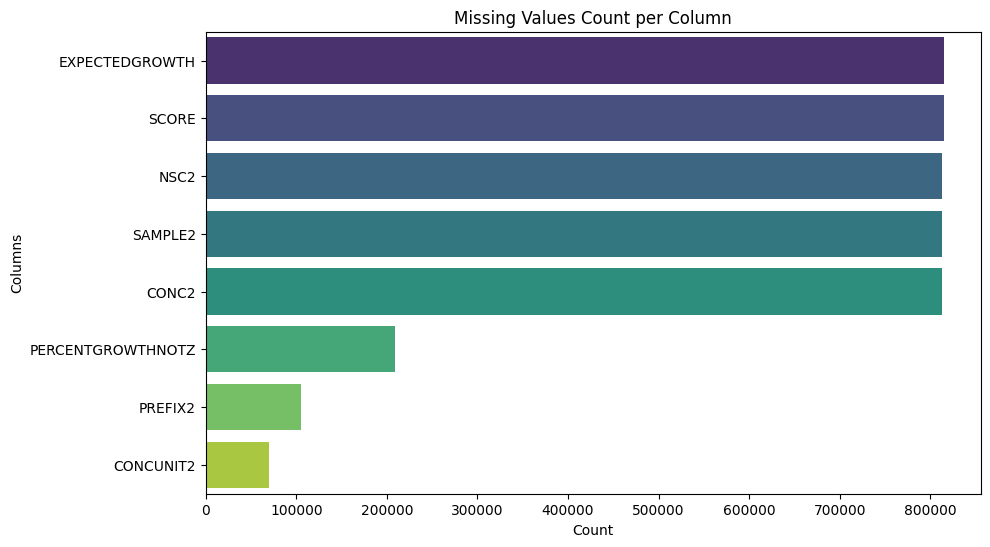

In [ ]:
# Barplot of missing values
missing = df.isnull().sum()
missing = missing[missing > 0].sort_values(ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x=missing.values, y=missing.index, palette="viridis")
plt.title("Missing Values Count per Column")
plt.xlabel("Count")
plt.ylabel("Columns")
plt.show()

<Axes: >

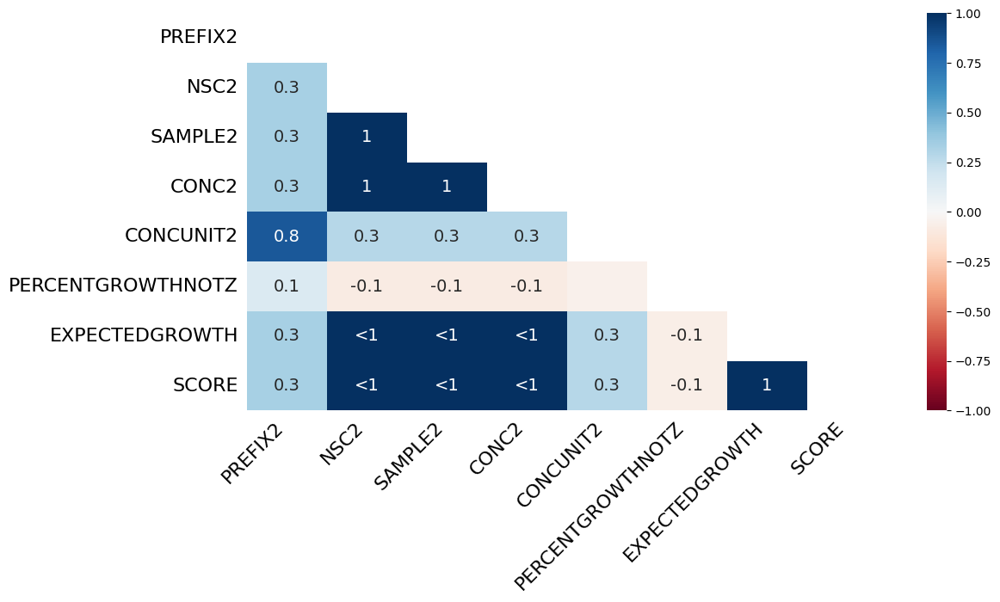

In [ ]:
import missingno as msno

# Missing data heatmap
msno.heatmap(df.sample(1000), figsize=(12, 6))

In [ ]:
# Missing % of SCORE per PANEL
missing_by_panel = df.groupby('PANEL')['SCORE'].apply(lambda x: x.isnull().mean()).sort_values(ascending=False)
# Top 10 panels with most missing SCORE
missing_by_panel.head(10)


,SCORE
PANEL,
Colon Cancer,0.224911
Leukemia,0.224684
Non-Small Cell Lung Cancer,0.223973
Ovarian Cancer,0.221688
Breast Cancer,0.220956
Renal Cancer,0.220816
Prostate Cancer,0.220783
CNS Cancer,0.216570
Melanoma,0.215526


Text(0.5, 1.0, 'Effect of Missing SCORE on PERCENTGROWTH Distribution')

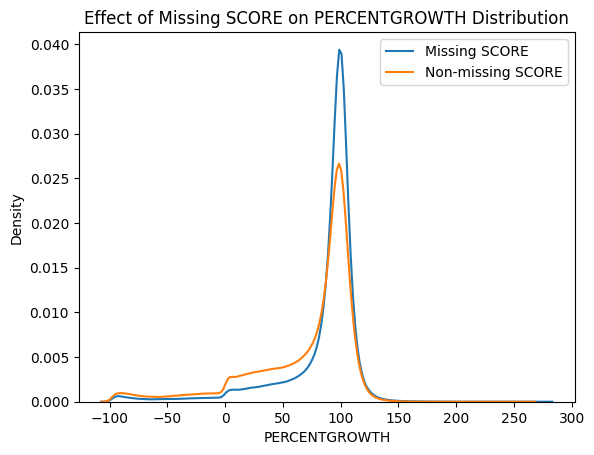

In [ ]:
# Comparing distribution of PERCENTGROWTH for rows with and without missing SCORE
sns.kdeplot(df[df['SCORE'].isnull()]['PERCENTGROWTH'], label='Missing SCORE')
sns.kdeplot(df[df['SCORE'].notnull()]['PERCENTGROWTH'], label='Non-missing SCORE')
plt.legend()
plt.title('Effect of Missing SCORE on PERCENTGROWTH Distribution')

In [ ]:
# Kolmogorov-Smirnov test for distribution differences
from scipy.stats import ks_2samp
ks_stat, p_value = ks_2samp(
    df[df['SCORE'].isnull()]['PERCENTGROWTH'],
    df[df['SCORE'].notnull()]['PERCENTGROWTH']
)
print(f"KS Statistic: {ks_stat}, p-value: {p_value}")

KS Statistic: 0.17951516001504098, p-value: 0.0


Since SCORE is our target variable, rows with missing values cannot be used for model training. The missingness is non-random (KS test p=0.0), meaning imputation could introduce bias. The distribution of PERCENTGROWTH remains nearly identical after deletion (as shown in the density plot), confirming minimal impact on data quality. While this removes ~22% of rows, the retained data is representative across all cancer types, making deletion the most reliable approach. This ensures model integrity while avoiding the risks of imputing the target variable.

In [ ]:
df['PANEL'].unique()

array(['Renal Cancer', 'Non-Small Cell Lung Cancer', 'Leukemia',
       'Colon Cancer', 'Prostate Cancer', 'Ovarian Cancer', 'Melanoma',
       'Breast Cancer', 'CNS Cancer'], dtype=object)

In [ ]:
len(df['PANEL'].unique())

9

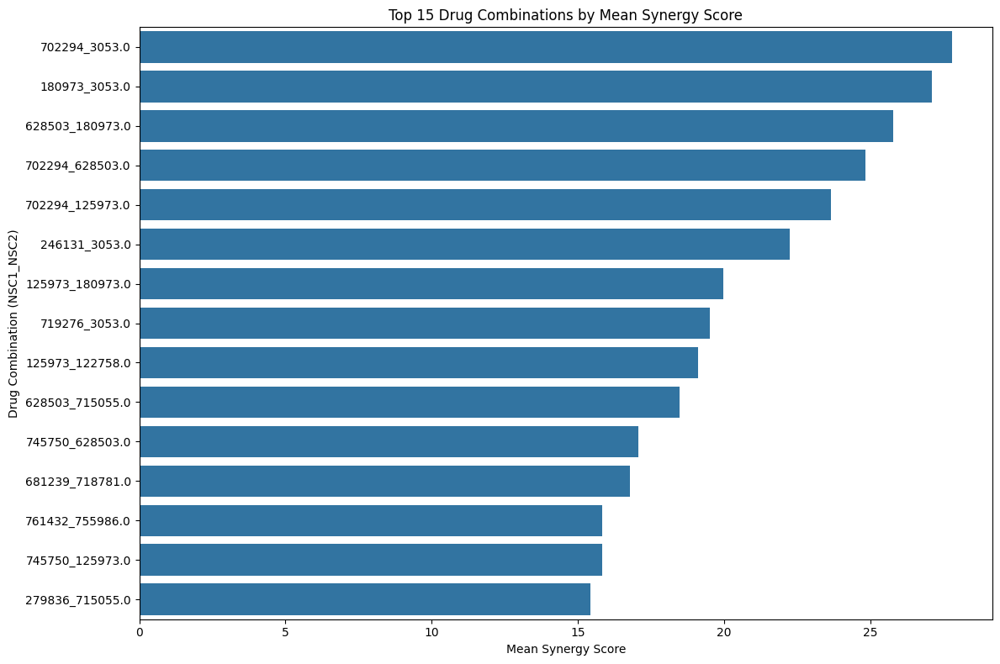

In [ ]:
df['drug_combo'] = df['NSC1'].astype(str) + '_' + df['NSC2'].astype(str)

# Finding top synergistic combinations
top_combos = df.groupby('drug_combo')['SCORE'].mean().sort_values(ascending=False).head(15)

plt.figure(figsize=(12, 8))
sns.barplot(x=top_combos.values, y=top_combos.index)
plt.title('Top 15 Drug Combinations by Mean Synergy Score')
plt.xlabel('Mean Synergy Score')
plt.ylabel('Drug Combination (NSC1_NSC2)')
plt.tight_layout()
plt.show()


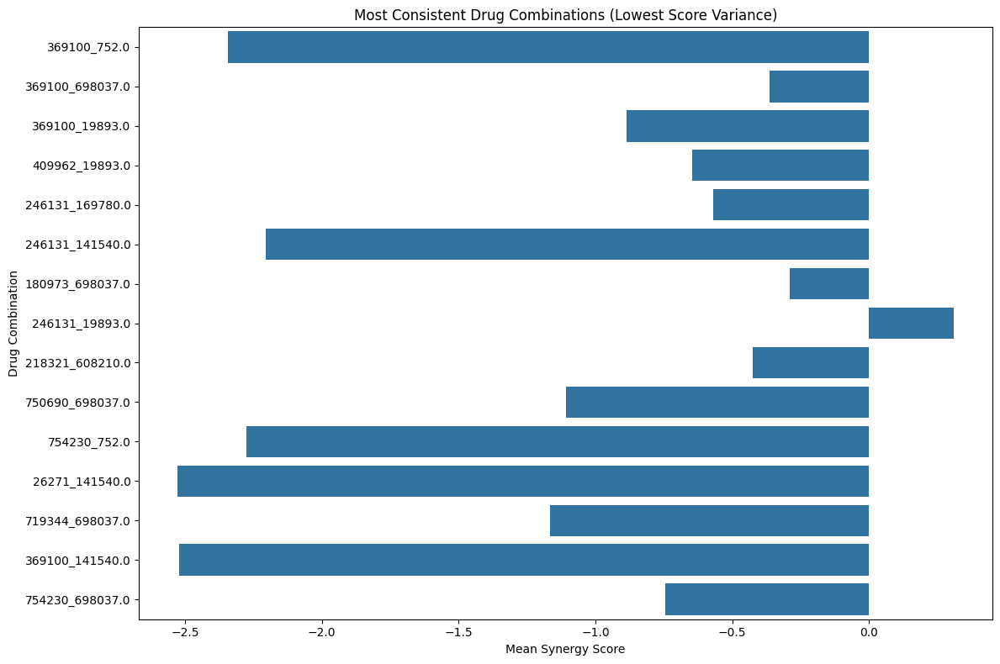

In [ ]:
# Find most consistent drug combinations (lowest variance in scores)
combo_stats = df.groupby('drug_combo')['SCORE'].agg(['mean', 'std', 'count'])
combo_stats = combo_stats[combo_stats['count'] > 5]
consistent_combos = combo_stats.sort_values('std').head(15)

plt.figure(figsize=(12, 8))
sns.barplot(x=consistent_combos['mean'].values, y=consistent_combos.index)
plt.title('Most Consistent Drug Combinations (Lowest Score Variance)')
plt.xlabel('Mean Synergy Score')
plt.ylabel('Drug Combination')
plt.tight_layout()
plt.show()

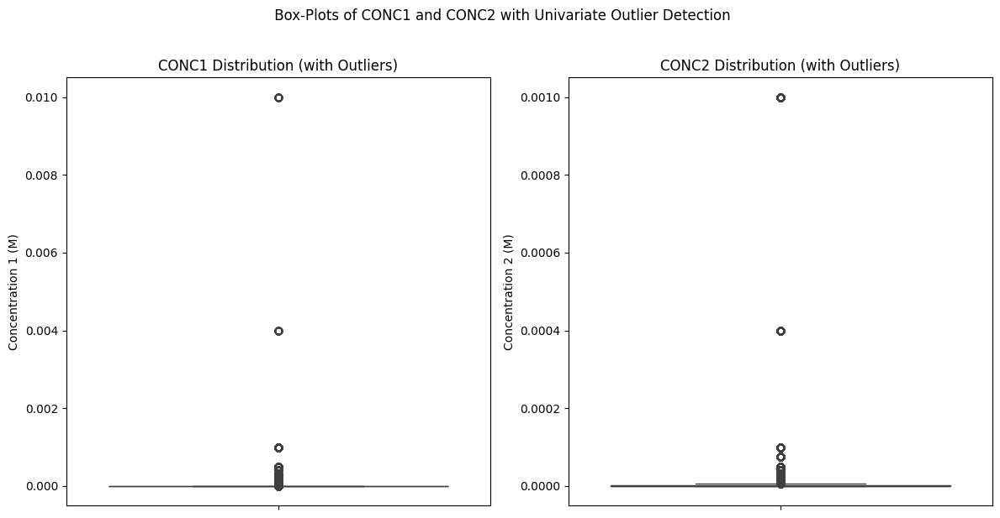

In [ ]:
# Plot box plots
fig, axes = plt.subplots(ncols=2, figsize=(12, 6))

sns.boxplot(y=df['CONC1'], ax=axes[0])
axes[0].set_title('CONC1 Distribution (with Outliers)')
axes[0].set_ylabel('Concentration 1 (M)')

sns.boxplot(y=df['CONC2'], ax=axes[1])
axes[1].set_title('CONC2 Distribution (with Outliers)')
axes[1].set_ylabel('Concentration 2 (M)')

plt.suptitle(' Box-Plots of CONC1 and CONC2 with Univariate Outlier Detection', y=1.02)
plt.tight_layout()
plt.show()

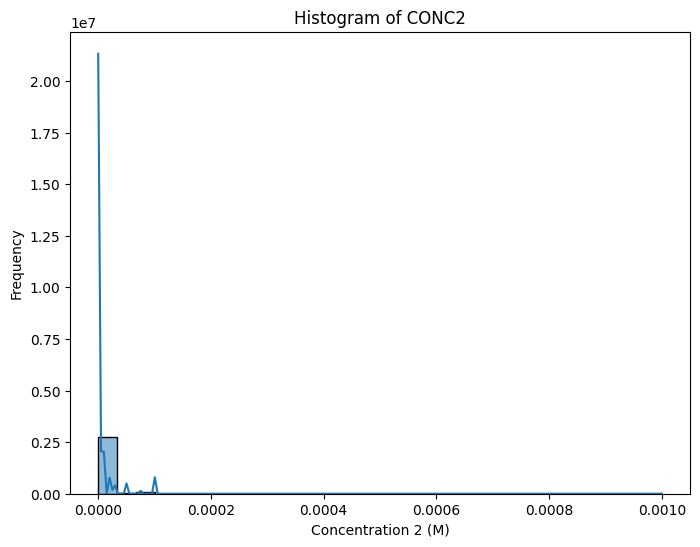

In [ ]:
# Histogram for CONC2
plt.figure(figsize=(8, 6))
sns.histplot(df['CONC2'], bins=30, kde=True)
plt.title('Histogram of CONC2')
plt.xlabel('Concentration 2 (M)')
plt.ylabel('Frequency')
plt.show()

In [ ]:
outlier_counts = {}
for col in ['CONC1', 'CONC2']:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outlier_counts[col] = df[(df[col] < lower_bound) | (df[col] > upper_bound)].shape[0]

# Print outlier counts
for col, count in outlier_counts.items():
    print(f"{col} outliers (1.5×IQR rule): {count}")


CONC1 outliers (1.5×IQR rule): 748862
CONC2 outliers (1.5×IQR rule): 476922


In [ ]:
# Calculate bounds again and view actual outliers
outliers_conc1 = df[
    (df['CONC1'] < df['CONC1'].quantile(0.25) - 1.5 * (df['CONC1'].quantile(0.75) - df['CONC1'].quantile(0.25))) |
    (df['CONC1'] > df['CONC1'].quantile(0.75) + 1.5 * (df['CONC1'].quantile(0.75) - df['CONC1'].quantile(0.25)))
]

outliers_conc2 = df[
    (df['CONC2'] < df['CONC2'].quantile(0.25) - 1.5 * (df['CONC2'].quantile(0.75) - df['CONC2'].quantile(0.25))) |
    (df['CONC2'] > df['CONC2'].quantile(0.75) + 1.5 * (df['CONC2'].quantile(0.75) - df['CONC2'].quantile(0.25)))
]

# Show a few rows of each
print("Outliers in CONC1:")
print(outliers_conc1[['CONC1']].head())

print("\nOutliers in CONC2:")
print(outliers_conc2[['CONC2']].head())


Outliers in CONC1:
      CONC1
6   0.00001
7   0.00001
8   0.00001
15  0.00001
16  0.00001

Outliers in CONC2:
     CONC2
1  0.00001
2  0.00010
4  0.00001
5  0.00010
7  0.00001


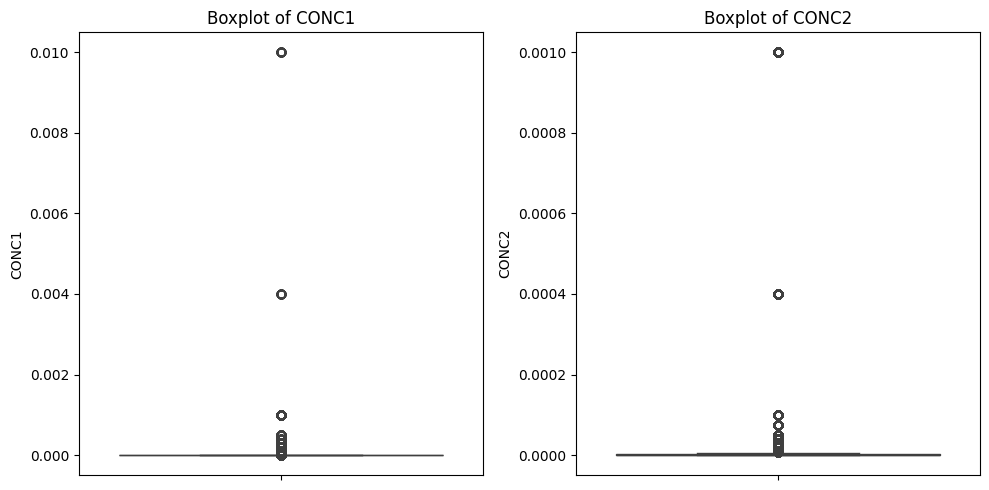

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
sns.boxplot(y=df['CONC1'])
plt.title("Boxplot of CONC1")

plt.subplot(1, 2, 2)
sns.boxplot(y=df['CONC2'])
plt.title("Boxplot of CONC2")

plt.tight_layout()
plt.show()


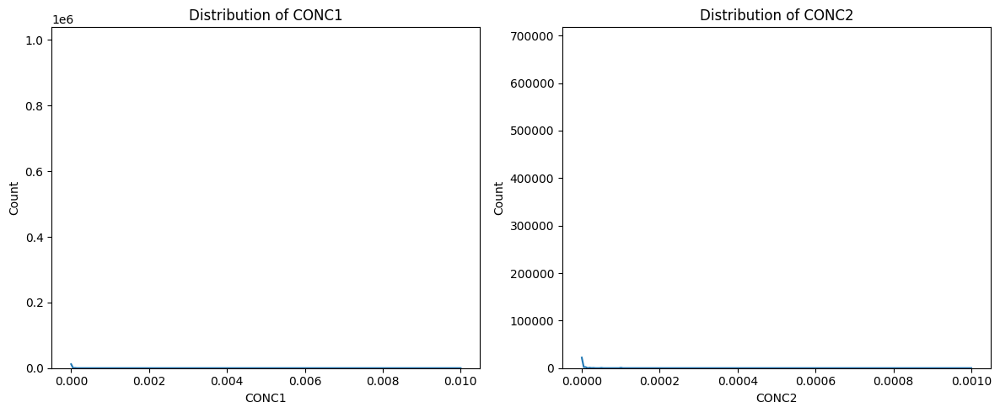

In [ ]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.histplot(df['CONC1'], kde=True)
plt.title('Distribution of CONC1')
plt.subplot(1, 2, 2)
sns.histplot(df['CONC2'], kde=True)
plt.title('Distribution of CONC2')
plt.tight_layout()
plt.show()

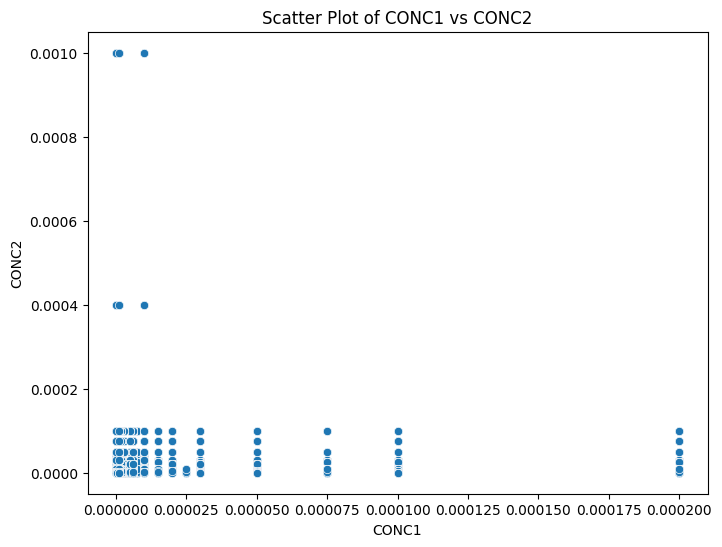

In [ ]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x=df['CONC1'], y=df['CONC2'])
plt.title('Scatter Plot of CONC1 vs CONC2')
plt.xlabel('CONC1')
plt.ylabel('CONC2')
plt.show()

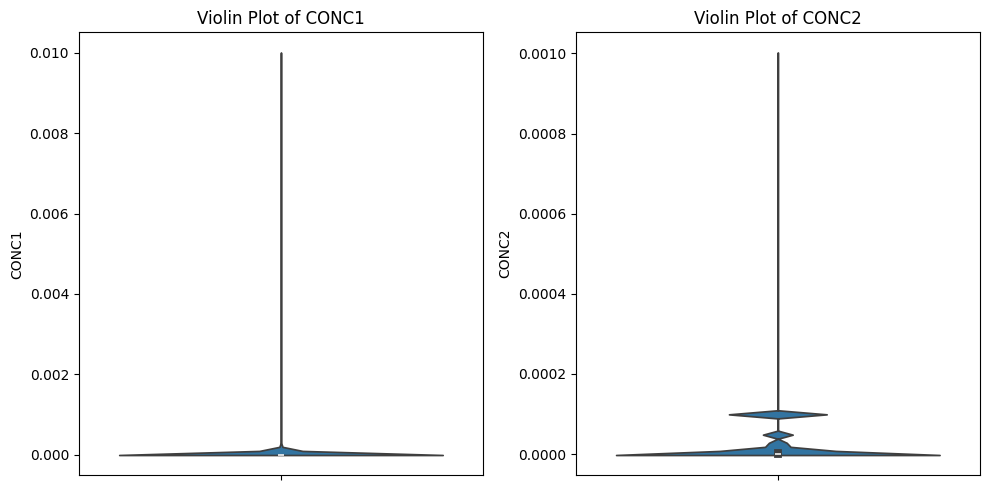

In [ ]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
sns.violinplot(y=df['CONC1'])
plt.title('Violin Plot of CONC1')
plt.subplot(1, 2, 2)
sns.violinplot(y=df['CONC2'])
plt.title('Violin Plot of CONC2')
plt.tight_layout()
plt.show()

data is too much schequed so using log transform and visualize violion data again so that we can have all data in certain range and get proper visualization

In [ ]:
LOG_CONC_1 = np.log10(df['CONC1'] + 1e-9)
LOG_CONC_2 = np.log10(df['CONC2'] + 1e-9)

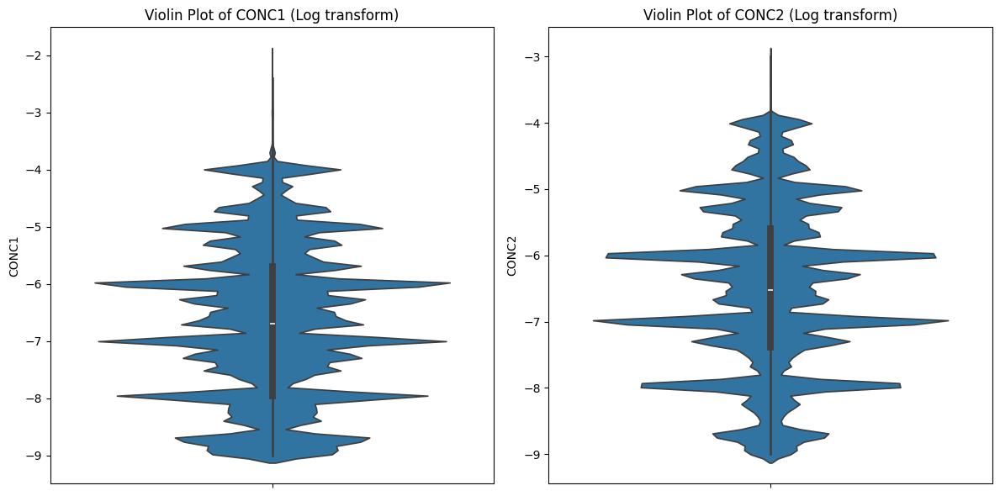

In [ ]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.violinplot(y=LOG_CONC_1)
plt.title('Violin Plot of CONC1 (Log transform)')
plt.ylabel('CONC1')

plt.subplot(1, 2, 2)
sns.violinplot(y=LOG_CONC_2)
plt.title('Violin Plot of CONC2 (Log transform)')
plt.ylabel('CONC2')

plt.tight_layout()
plt.show()

Lets identify are there any outlier or not

In [ ]:
Q1_conc1 = df['CONC1'].quantile(0.25)
Q3_conc1 = df['CONC1'].quantile(0.75)
IQR_conc1 = Q3_conc1 - Q1_conc1
lower_bound_conc1 = Q1_conc1 - 1.5 * IQR_conc1
upper_bound_conc1 = Q3_conc1 + 1.5 * IQR_conc1

In [ ]:
Q1_conc2 = df['CONC2'].quantile(0.25)
Q3_conc2 = df['CONC2'].quantile(0.75)
IQR_conc2 = Q3_conc2 - Q1_conc2
lower_bound_conc2 = Q1_conc2 - 1.5 * IQR_conc2
upper_bound_conc2 = Q3_conc2 + 1.5 * IQR_conc2

In [ ]:
print("--- CONC1 without Outliers ---")
print(f"Original CONC1 count: {len(df['CONC1'])}")
print(f"CONC1 without outliers count: {len(conc1_without_outlier)}")
print(f"Number of CONC1 outliers removed: {len(df['CONC1']) - len(conc1_without_outlier)}")
print("\nFirst 5 values of conc1_without_outlier:")
print(conc1_without_outlier.head())

--- CONC1 without Outliers ---
Original CONC1 count: 3686475
CONC1 without outliers count: 2937613
Number of CONC1 outliers removed: 748862

First 5 values of conc1_without_outlier:
0    1.000000e-07
1    1.000000e-07
2    1.000000e-07
3    1.000000e-06
4    1.000000e-06
Name: CONC1, dtype: float64


In [ ]:
print("\n--- CONC2 without Outliers ---")
print(f"Original CONC2 count: {len(df['CONC2'])}")
print(f"CONC2 without outliers count: {len(conc2_without_outlier)}")
print(f"Number of CONC2 outliers removed: {len(df['CONC2']) - len(conc2_without_outlier)}")
print("\nFirst 5 values of conc2_without_outlier:")
print(conc2_without_outlier.head())


--- CONC2 without Outliers ---
Original CONC2 count: 3686475
CONC2 without outliers count: 2396592
Number of CONC2 outliers removed: 1289883

First 5 values of conc2_without_outlier:
0     1.000000e-06
3     1.000000e-06
6     1.000000e-06
9     1.000000e-07
10    1.000000e-06
Name: CONC2, dtype: float64


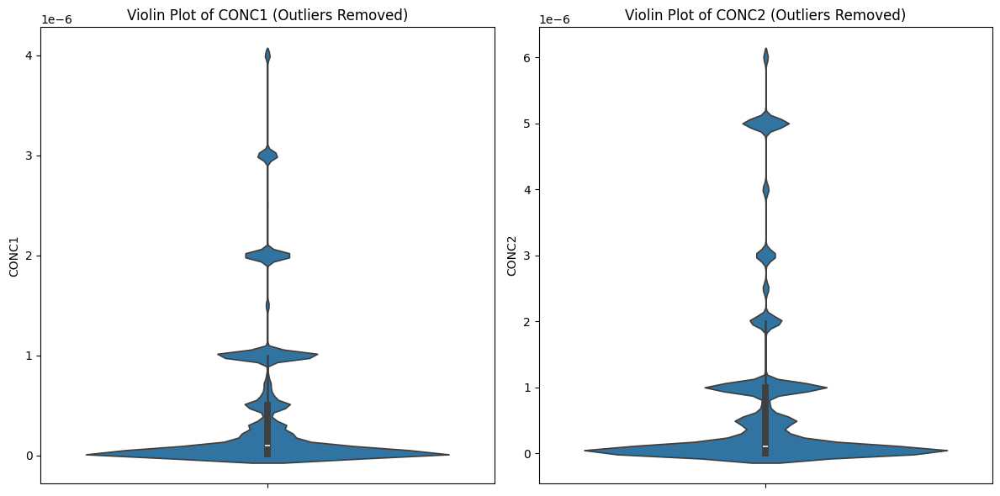

In [ ]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.violinplot(y=conc1_without_outlier)
plt.title('Violin Plot of CONC1 (Outliers Removed)')
plt.ylabel('CONC1')

plt.subplot(1, 2, 2)
sns.violinplot(y=conc2_without_outlier)
plt.title('Violin Plot of CONC2 (Outliers Removed)')
plt.ylabel('CONC2')

plt.tight_layout()
plt.show()

In [ ]:
LOG_CONC1 = np.log10(conc1_without_outlier + 1e-9)
LOG_CONC2 = np.log10(conc2_without_outlier + 1e-9)

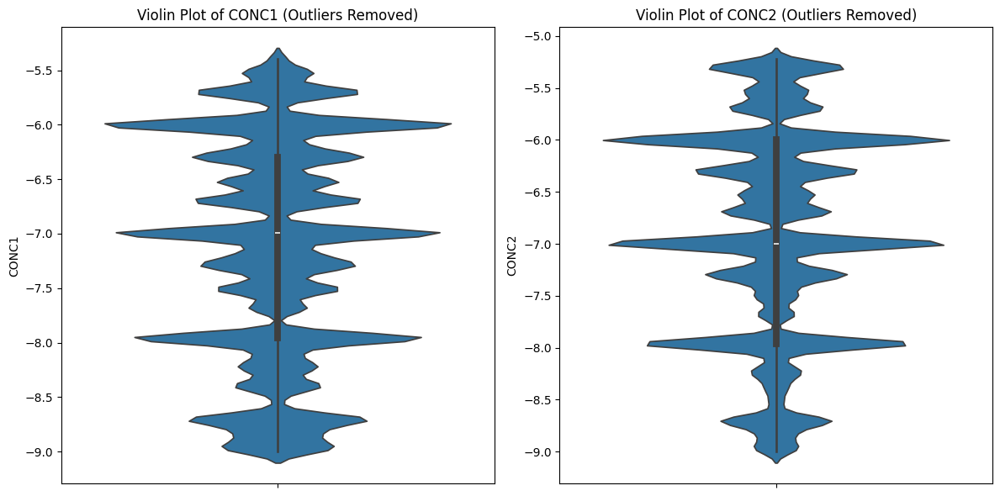

In [ ]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.violinplot(y=LOG_CONC1)
plt.title('Violin Plot of CONC1 (Outliers Removed)')
plt.ylabel('CONC1')

plt.subplot(1, 2, 2)
sns.violinplot(y=LOG_CONC2)
plt.title('Violin Plot of CONC2 (Outliers Removed)')
plt.ylabel('CONC2')

plt.tight_layout()
plt.show()

So after removing outlier and doing log transfrom also we get same result as it was before so we are not removing any data

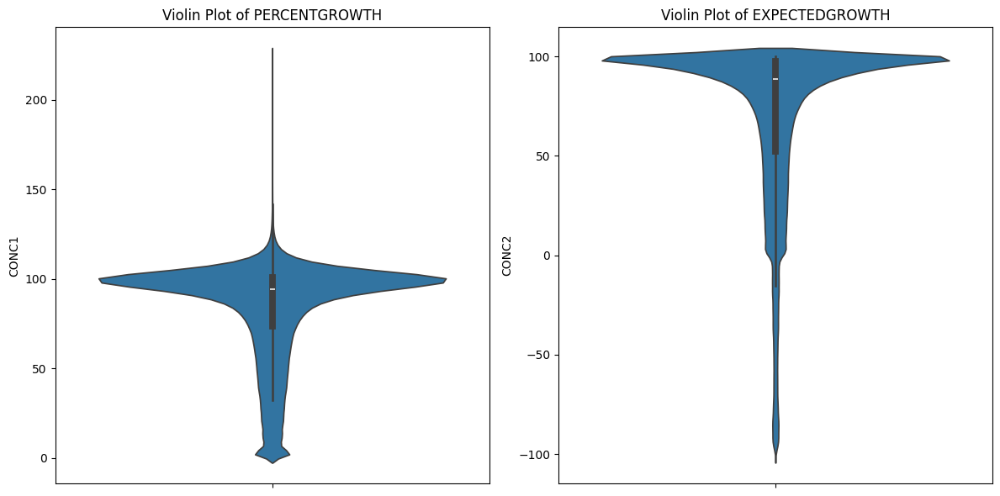

In [ ]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.violinplot(y=df['PERCENTGROWTHNOTZ'])
plt.title('Violin Plot of PERCENTGROWTH')
plt.ylabel('PERCENTGROWTHNOTZ')

plt.subplot(1, 2, 2)
sns.violinplot(y=df['EXPECTEDGROWTH'])
plt.title('Violin Plot of EXPECTEDGROWTH')
plt.ylabel('CONC2')

plt.tight_layout()
plt.show()

In [ ]:
LOG_PERCENTGROWTH = np.log10(conc1_without_outlier + 1e-9)
LOG_EXPECTEDGROWTH = np.log10(conc2_without_outlier + 1e-9)

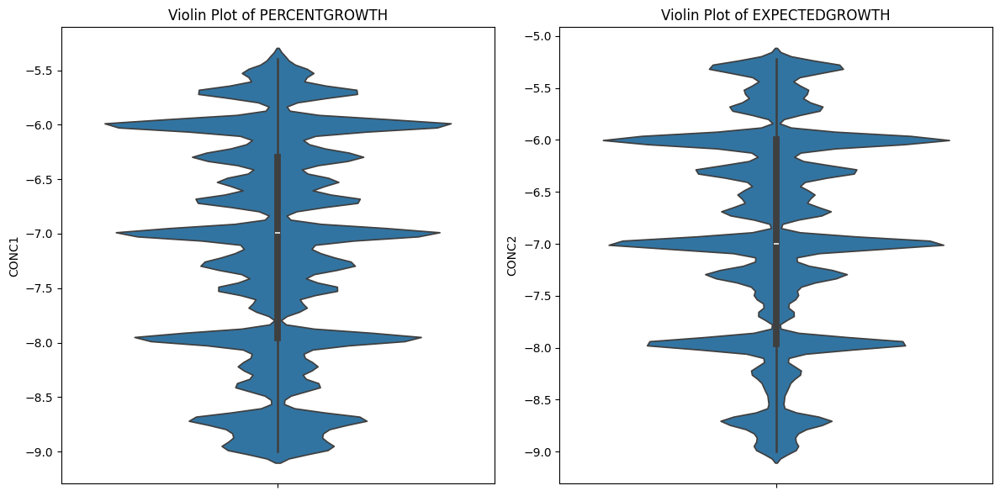

In [ ]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.violinplot(LOG_PERCENTGROWTH)
plt.title('Violin Plot of PERCENTGROWTH')
plt.ylabel('CONC1')

plt.subplot(1, 2, 2)
sns.violinplot(LOG_EXPECTEDGROWTH)
plt.title('Violin Plot of EXPECTEDGROWTH')
plt.ylabel('CONC2')

plt.tight_layout()
plt.show()

In [ ]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.violinplot(y=df['PERCENTGROWTH'])
plt.title('Violin Plot of PERCENTGROWTH')
plt.ylabel('PERCENTGROWTH')


plt.tight_layout()
plt.show()

In [ ]:
high_growth_count = (df['EXPECTEDGROWTH'] > 150).sum()

# Total number of rows in the dataset
total_rows = df.shape[0]

# Percentage of rows with EXPECTEDGROWTH > 150
high_growth_percent = (high_growth_count / total_rows) * 100

# Print results
print(f" Rows with EXPECTEDGROWTH > 150: {high_growth_count}")
print(f" Percentage of dataset: {high_growth_percent:.2f}%")


 Rows with EXPECTEDGROWTH > 150: 0
 Percentage of dataset: 0.00%


In [ ]:
high_growth_count = (df['PERCE'] > 150).sum()

# Total number of rows in the dataset
total_rows = df.shape[0]

# Percentage of rows with EXPECTEDGROWTH > 150
high_growth_percent = (high_growth_count / total_rows) * 100

# Print results
print(f" Rows with EXPECTEDGROWTH > 150: {high_growth_count}")
print(f" Percentage of dataset: {high_growth_percent:.2f}%")


In [ ]:
# Create 'conc1_without_outlier' Series
conc1_without_outlier = df['CONC1'][
    (df['CONC1'] >= lower_bound_conc1) & (df['CONC1'] <= upper_bound_conc1)
].copy()

# Create 'conc2_without_outlier' Series
conc2_without_outlier = df['CONC2'][
    (df['CONC2'] >= lower_bound_conc2) & (df['CONC2'] <= upper_bound_conc2)
].copy()


In [ ]:
outlier_counts = {}
for col in ['CONC1', 'CONC2']:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outlier_counts[col] = df[(df[col] < lower_bound) | (df[col] > upper_bound)].shape[0]

# Print outlier counts
for col, count in outlier_counts.items():
    print(f"{col} outliers (1.5×IQR rule): {count}")


CONC1 outliers (1.5×IQR rule): 748862
CONC2 outliers (1.5×IQR rule): 476922


In [ ]:
# IQR-based outlier detection for SCORE
Q1 = df['SCORE'].quantile(0.25)
Q3 = df['SCORE'].quantile(0.75)
IQR = Q3 - Q1
outliers = df[(df['SCORE'] < (Q1 - 1.5 * IQR)) | (df['SCORE'] > (Q3 + 1.5 * IQR))]
print("Number of SCORE outliers:", len(outliers))

Number of SCORE outliers: 154960


In [ ]:
# Clip all scores to the [–100, +100] interval
df['SCORE_clipped'] = df['SCORE'].clip(-100, 100)

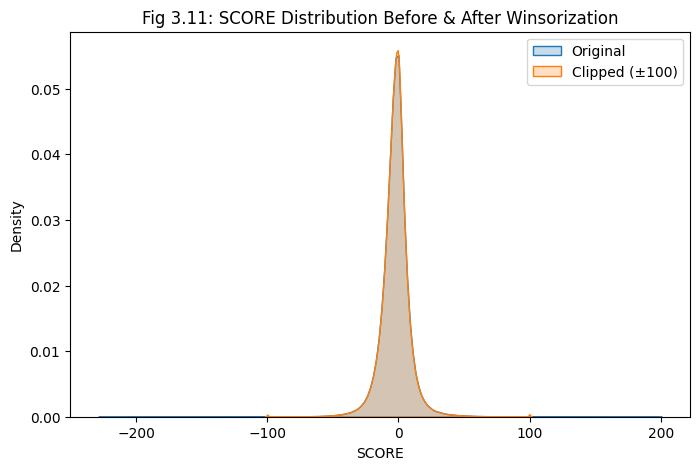

In [ ]:
plt.figure(figsize=(8,5))
sns.kdeplot(df['SCORE'], label='Original', fill=True)
sns.kdeplot(df['SCORE_clipped'], label='Clipped (±100)', fill=True)
plt.title("Fig 3.11: SCORE Distribution Before & After Winsorization")
plt.legend()
plt.show()

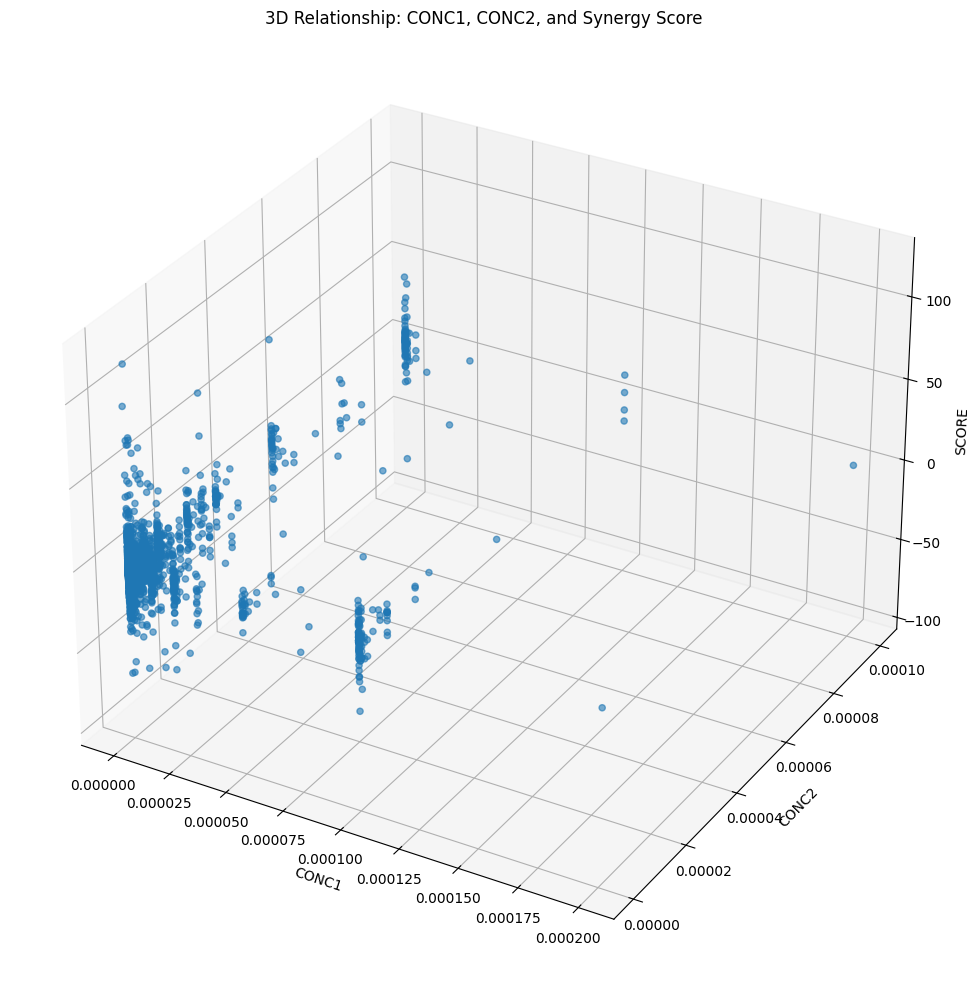

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
sample = df.sample(3000)
ax.scatter(sample['CONC1'], sample['CONC2'], sample['SCORE'], alpha=0.6)
ax.set_xlabel('CONC1')
ax.set_ylabel('CONC2')
ax.set_zlabel('SCORE')
ax.set_title('3D Relationship: CONC1, CONC2, and Synergy Score')
plt.tight_layout()
plt.show()

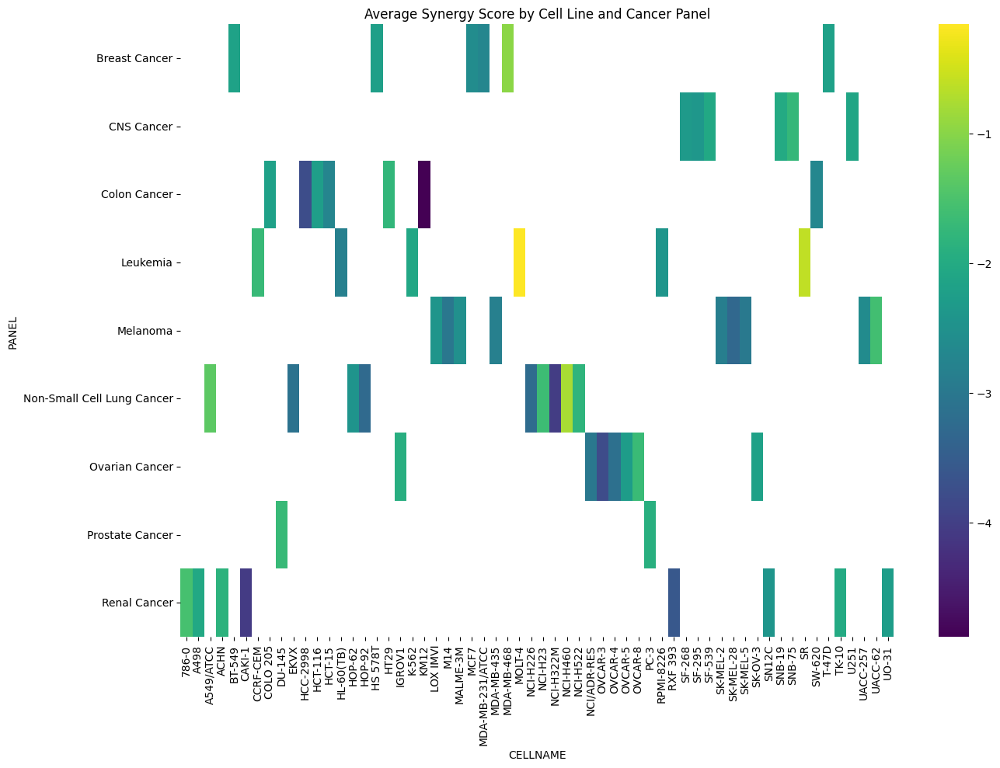

In [ ]:
# Heatmap of average score by cell line and cancer panel
pivot_df = df.pivot_table(values='SCORE', index='PANEL', columns='CELLNAME', aggfunc='mean')
plt.figure(figsize=(14, 10))
sns.heatmap(pivot_df, cmap='viridis', annot=False)
plt.title('Average Synergy Score by Cell Line and Cancer Panel')
plt.tight_layout()
plt.show()


In [ ]:
# Identify your outlier thresholds
lower, upper = Q1 - 1.5*IQR, Q3 + 1.5*IQR

# Subset to just the outliers
outliers = df[(df['SCORE'] < lower) | (df['SCORE'] > upper)]

plt.figure(figsize=(8, 5))
sns.scatterplot(
    x='conc_ratio', y='SCORE',
    data=outliers.sample(2000), alpha=0.6
)
plt.xscale('log')
plt.title('Fig 3.Z: Scatter of Concentration Ratio vs. Synergy Score (Outliers Only)')
plt.xlabel('Concentration Ratio (log scale)')
plt.ylabel('Synergy Score')
plt.show()

ValueError: Could not interpret value `conc_ratio` for `x`. An entry with this name does not appear in `data`.

<Figure size 800x500 with 0 Axes>

In [ ]:
# Outlier Detection for SCORE

# Using the 1.5xIQR rule
Q1_score = df['SCORE'].quantile(0.25)
Q3_score = df['SCORE'].quantile(0.75)
IQR_score = Q3_score - Q1_score
lower_bound_iqr_score = Q1_score - 1.5 * IQR_score
upper_bound_iqr_score = Q3_score + 1.5 * IQR_score
outliers_iqr_score = df[(df['SCORE'] < lower_bound_iqr_score) | (df['SCORE'] > upper_bound_iqr_score)]
num_outliers_iqr_score = outliers_iqr_score.shape[0]

print(f"Number of outliers in SCORE (1.5xIQR rule): {num_outliers_iqr_score}")

# Using the standard value exceeding 100 as an outlier
outliers_standard_score = df[df['SCORE'] > 100]
num_outliers_standard_score = outliers_standard_score.shape[0]

print(f"Number of outliers in SCORE (exceeding 100): {num_outliers_standard_score}")

Number of outliers in SCORE (1.5xIQR rule): 154960
Number of outliers in SCORE (exceeding 100): 1766


Distribution and relation among data

In [ ]:
# ANOVA test to compare effectiveness across cell lines
from scipy.stats import f_oneway

# Get top 5 most common cell lines
top_cell_lines = df['CELLNAME'].value_counts().head(5).index.tolist()
cell_line_scores = [df[df['CELLNAME'] == cell]['SCORE'] for cell in top_cell_lines]

f_stat, p_val = f_oneway(*cell_line_scores)
print(f"ANOVA results for comparison across top 5 cell lines:")
print(f"F-statistic: {f_stat:.4f}, p-value: {p_val:.4e}")
print(f"{'Statistically significant differences' if p_val < 0.05 else 'No statistically significant differences'}")


ANOVA results for comparison across top 5 cell lines:
F-statistic: nan, p-value: nan
No statistically significant differences


In [ ]:
threshold = 50
df['effectiveness'] = df['SCORE'].apply(lambda x: 'High' if x > threshold else 'Low')

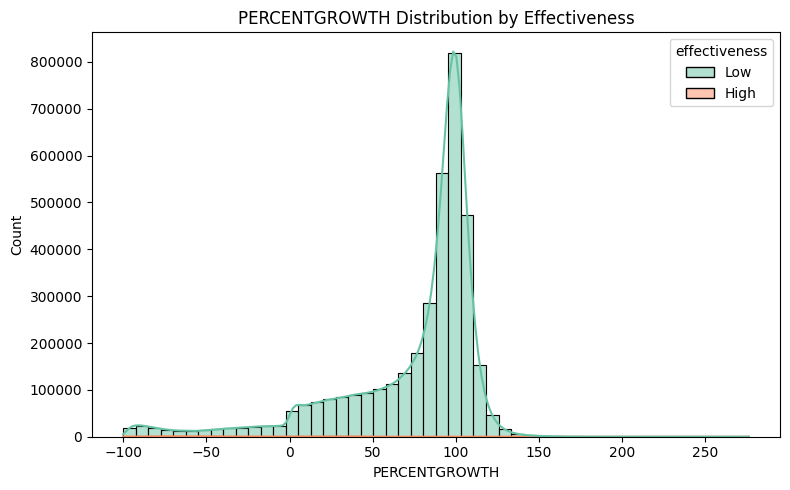

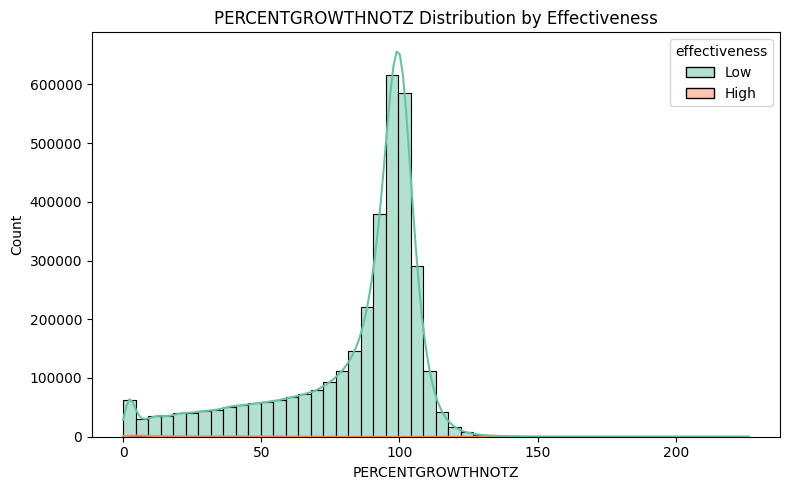

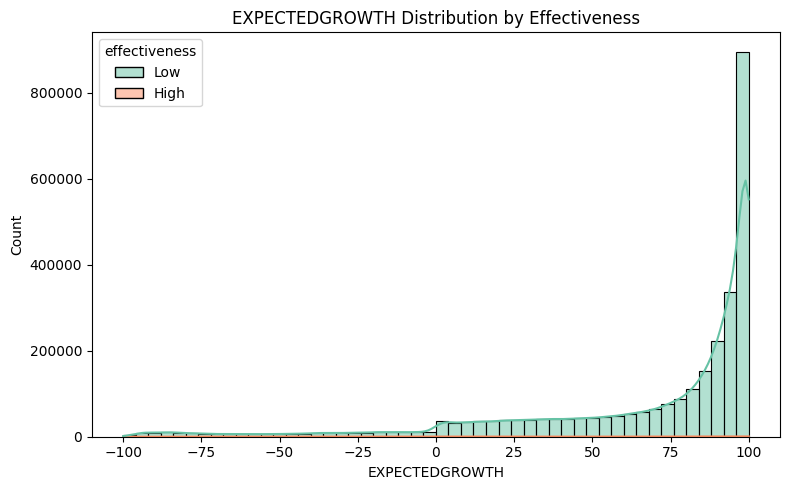

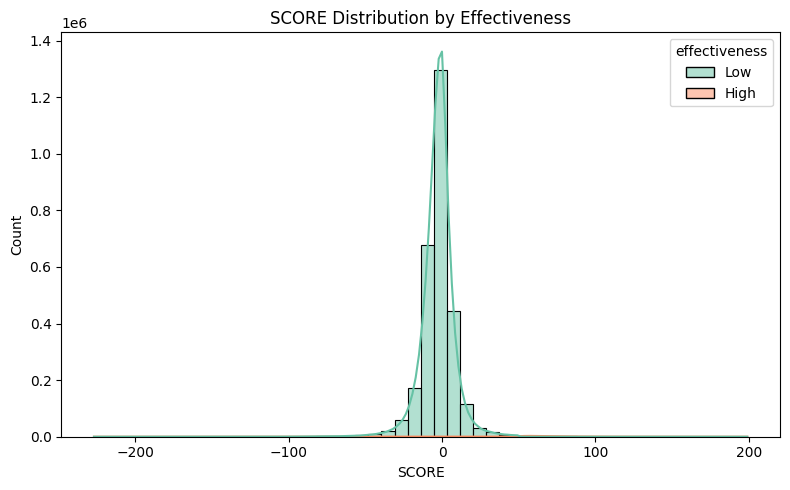

In [ ]:
numeric_cols = ['PERCENTGROWTH', 'PERCENTGROWTHNOTZ', 'EXPECTEDGROWTH', 'SCORE']

for col in numeric_cols:
    plt.figure(figsize=(8, 5))
    sns.histplot(data=df, x=col, hue='effectiveness', bins=50, kde=True, palette='Set2')
    plt.title(f'{col} Distribution by Effectiveness')
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()

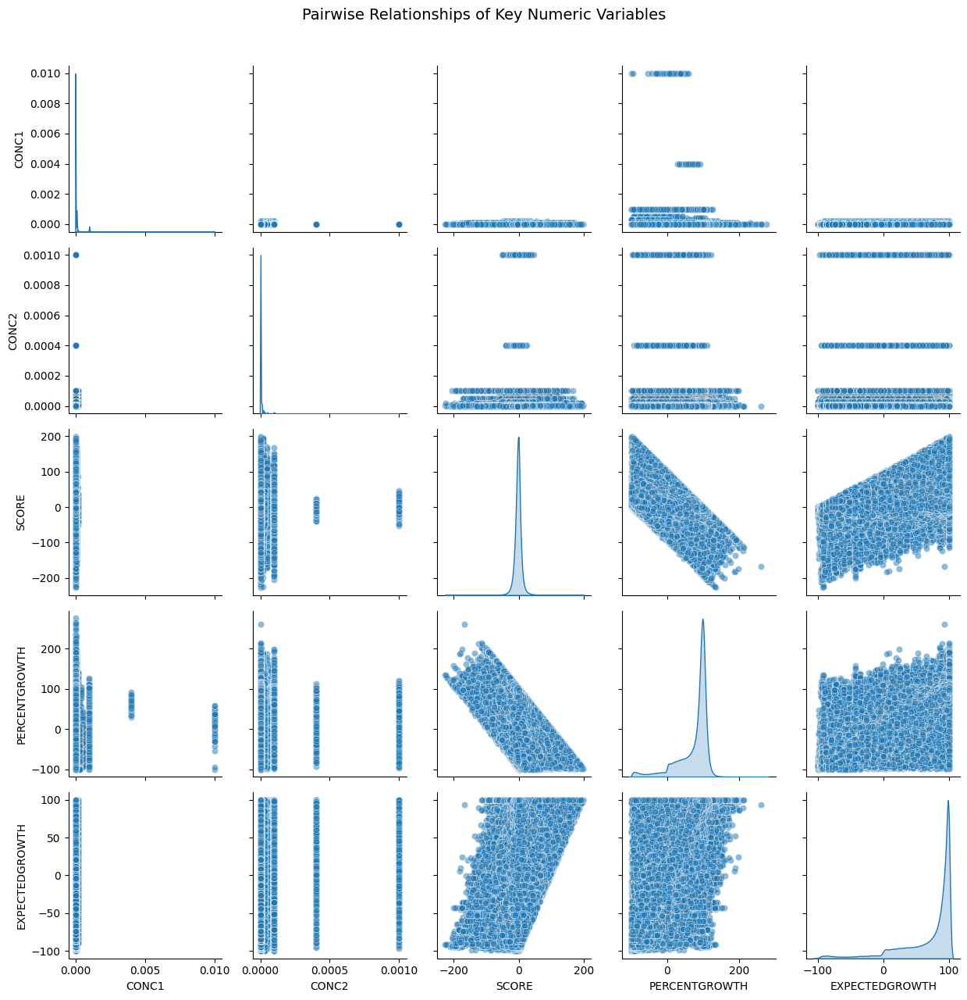

In [ ]:
# Pairplot of Key Numeric Variables
numeric_df = df[['CONC1', 'CONC2', 'SCORE', 'PERCENTGROWTH', 'EXPECTEDGROWTH']]
sns.pairplot(numeric_df,
             diag_kind='kde',
             plot_kws={'alpha': 0.5})
plt.suptitle('Pairwise Relationships of Key Numeric Variables', fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

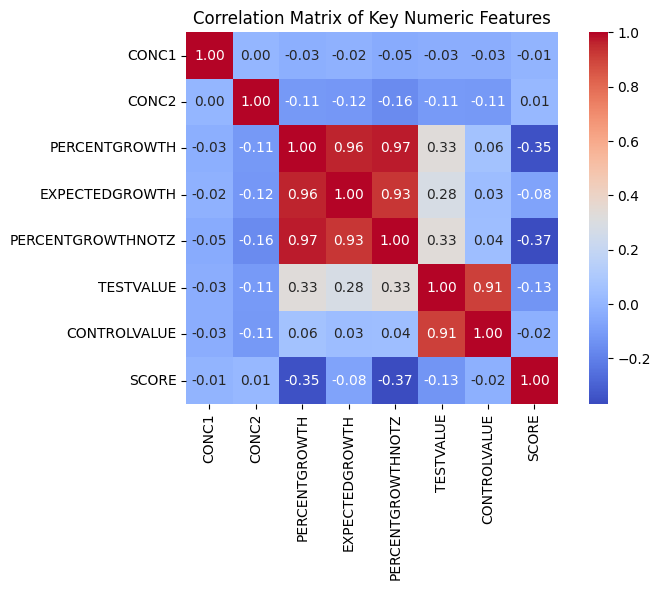

In [ ]:
# relevant numeric columns
numeric_cols = ['CONC1', 'CONC2', 'PERCENTGROWTH', 'EXPECTEDGROWTH','PERCENTGROWTHNOTZ','TESTVALUE','CONTROLVALUE', 'SCORE']

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(df[numeric_cols].corr(), annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Correlation Matrix of Key Numeric Features')
plt.tight_layout()
plt.show()
#  0   COMBODRUGSEQ       int64
#  1   SCREENER           object
#  2   STUDY              object
#  3   TESTDATE           object
#  4   PLATE              object
#  5   PANELNBR           int64
#  6   CELLNBR            int64
#  7   PREFIX1            object
#  8   NSC1               int64
#  9   SAMPLE1            int64
#  10  CONCINDEX1         int64
#  11  CONC1              float64
#  12  CONCUNIT1          object
#  13  PREFIX2            object
#  14  NSC2               float64
#  15  SAMPLE2            float64
#  16  CONCINDEX2         int64
#  17  CONC2              float64
#  18  CONCUNIT2          object
#  19  PERCENTGROWTH      float64
#  20  PERCENTGROWTHNOTZ  float64
#  21  TESTVALUE          float64
#  22  CONTROLVALUE       float64
#  23  TZVALUE            float64
#  24  EXPECTEDGROWTH     float64
#  25  SCORE              float64
#  26  VALID              object
#  27  PANEL              object
#  28  CELLNAME           object

In [ ]:
correlations = df.corr(numeric_only=True)['SCORE'].sort_values(ascending=False)
print("Top correlated features with 'Score':\n", correlations)

Top correlated features with 'Score':
 SCORE                1.000000
SCORE_clipped        0.993873
CONCINDEX2           0.082574
CONCINDEX1           0.054486
COMBODRUGSEQ         0.015236
NSC2                 0.014773
CONC2                0.014557
NSC1                 0.011456
SAMPLE1              0.008612
PANELNBR             0.006683
SAMPLE2              0.004022
CELLNBR             -0.001243
CONC1               -0.009245
CONTROLVALUE        -0.022688
TZVALUE             -0.041044
EXPECTEDGROWTH      -0.076559
TESTVALUE           -0.128779
PERCENTGROWTH       -0.347755
PERCENTGROWTHNOTZ   -0.367120
Name: SCORE, dtype: float64


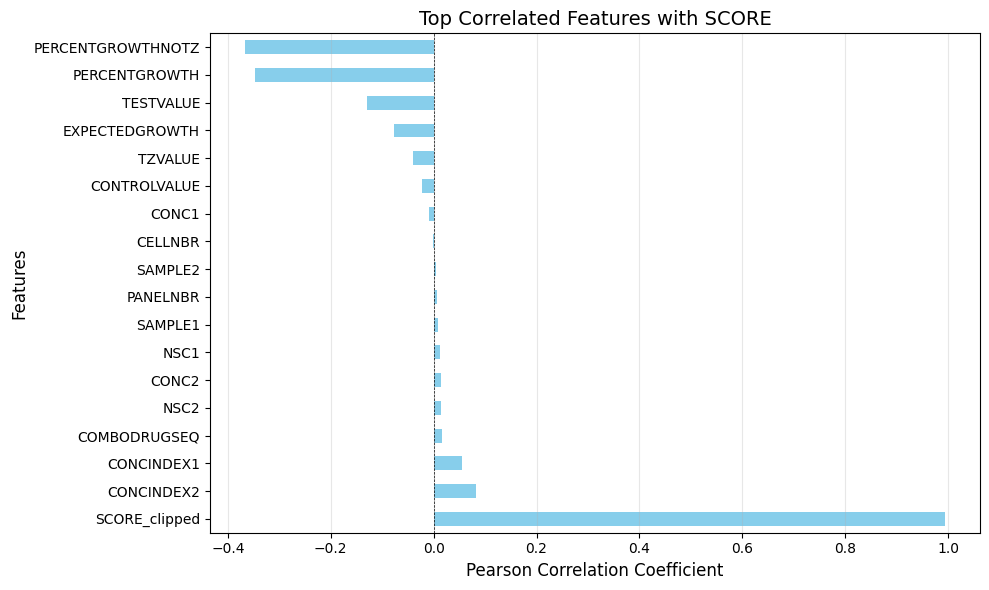

In [ ]:
plt.figure(figsize=(10, 6))
correlations.drop('SCORE').plot.barh(color='skyblue')  # Exclude self-correlation
plt.title('Top Correlated Features with SCORE', fontsize=14)
plt.xlabel('Pearson Correlation Coefficient', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.axvline(0, color='black', linestyle='--', linewidth=0.5)  # Zero line
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

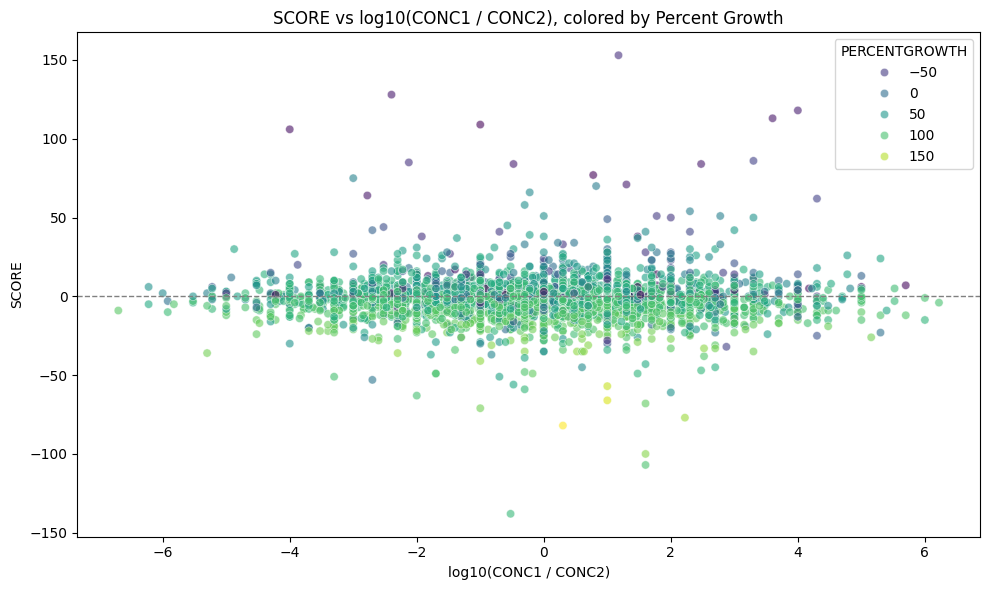

In [ ]:
# Create ratio and log transformation
df['conc_ratio'] = df['CONC1'] / df['CONC2'].replace(0, np.nan)
df['log_conc_ratio'] = np.log10(df['conc_ratio'])

#Scatter: log10(CONC1/CONC2) vs SCORE colored by PERCENTGROWTH ---
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df.sample(5000, random_state=42),
                x='log_conc_ratio', y='SCORE', hue='PERCENTGROWTH', palette='viridis', alpha=0.6)
plt.title('SCORE vs log10(CONC1 / CONC2), colored by Percent Growth')
plt.xlabel('log10(CONC1 / CONC2)')
plt.ylabel('SCORE')
plt.axhline(0, color='gray', linestyle='--', linewidth=1)
plt.tight_layout()
plt.show()

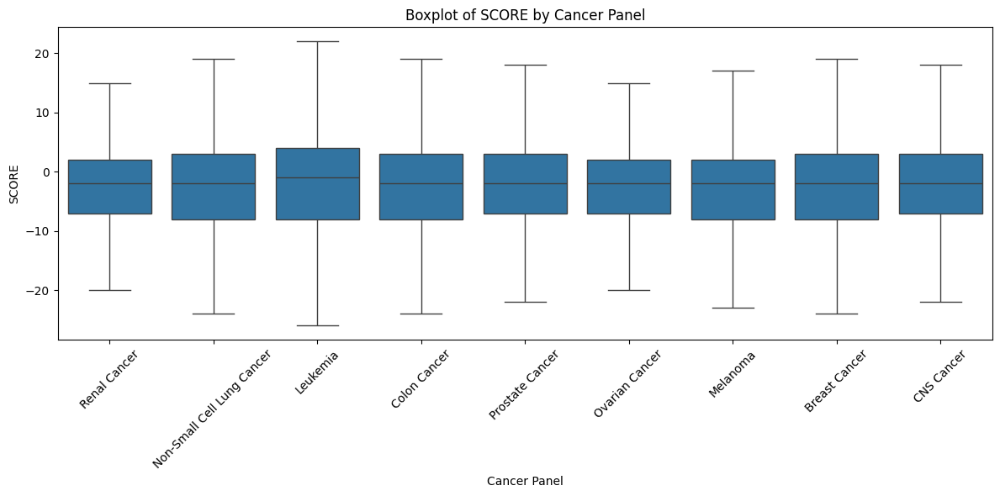

In [ ]:
# Boxplot of SCORE by PANEL ---
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='PANEL', y='SCORE', showfliers=False)
plt.xticks(rotation=45)
plt.title('Boxplot of SCORE by Cancer Panel')
plt.xlabel('Cancer Panel')
plt.ylabel('SCORE')
plt.tight_layout()
plt.show()

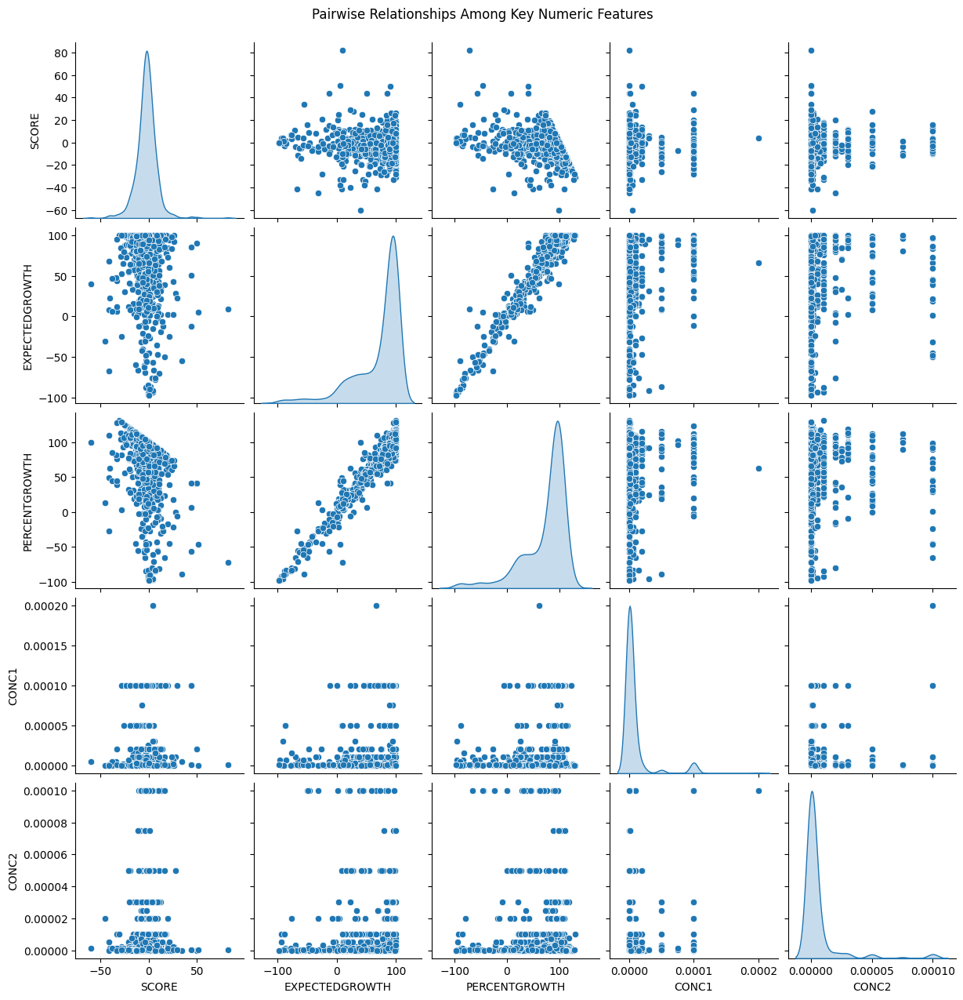

In [ ]:
sns.pairplot(df[['SCORE', 'EXPECTEDGROWTH', 'PERCENTGROWTH', 'CONC1', 'CONC2']].dropna().sample(1000), diag_kind='kde')
plt.suptitle('Pairwise Relationships Among Key Numeric Features', y=1.02)
plt.show()

In [ ]:
df['CONC1'].describe()
df['CONC1'].value_counts().head(10)

,count
CONC1,
1.000000e-06,369544
1.000000e-07,339429
1.000000e-08,300882
1.000000e-05,228282
2.000000e-07,178237
2.000000e-06,174334
1.000000e-09,174022
5.000000e-07,160086
5.000000e-08,138236


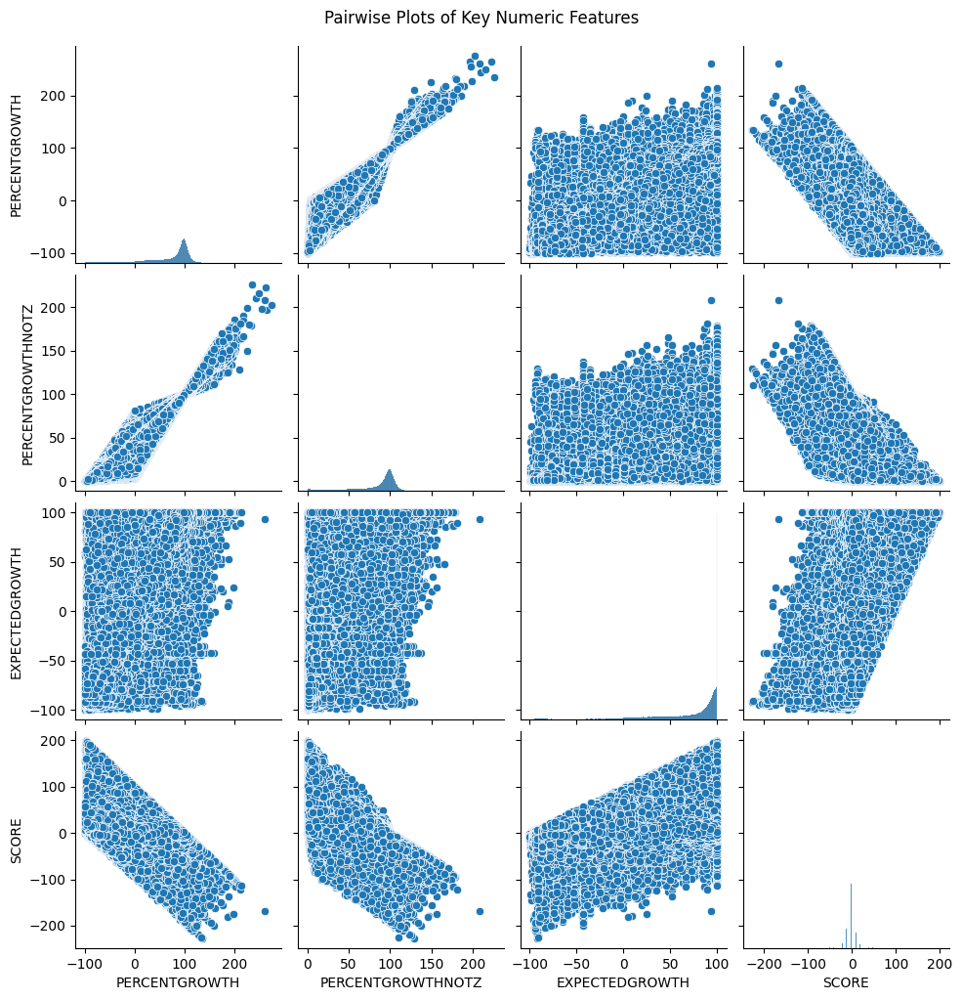

In [ ]:
sample_df = df.sample(n=5000, random_state=42)
sns.pairplot(df[numeric_cols])
plt.suptitle("Pairwise Plots of Key Numeric Features", y=1.02)
plt.show()

In [ ]:
numeric_cols = ['PERCENTGROWTH', 'PERCENTGROWTHNOTZ', 'EXPECTEDGROWTH', 'SCORE']  # Add 'CONC1', 'CONC2' if needed

# 1. Univariate Analysis

# Box Plots for all numeric columns
plt.figure(figsize=(12, 8))
for i, col in enumerate(numeric_cols):
    plt.subplot(2, 2, i + 1)
    sns.boxplot(y=df[col])
    plt.title(f'Box Plot of {col}')
plt.tight_layout()
plt.show()


In [ ]:
threshold_high_pg = df['PERCENTGROWTH'].quantile(0.99)
high_outliers_pg = df[df['PERCENTGROWTH'] > threshold_high_pg]
print("High PERCENTGROWTH Outliers:\n", high_outliers_pg)

In [ ]:
threshold_low_pg = df['PERCENTGROWTH'].quantile(0.01)  # Bottom 1%
low_outliers_pg = df[df['PERCENTGROWTH'] < threshold_low_pg]
print("\nLow PERCENTGROWTH Outliers:\n", low_outliers_pg)

In [ ]:
df.info()

In [ ]:

def check_expected_growth_doc(row):
    """Checks ExpectedGrowth calculation based on the ALMANAC documentation."""
    growth1 = row['PERCENTGROWTH']
    growth2 = row['PERCENTGROWTHNOTZ']

    if pd.isna(growth1) or pd.isna(growth2):
        return False

    if growth1 < 0 or growth2 < 0:
        expected_growth_calculated = min(growth1, growth2)
    else:
        expected_growth_calculated = (min(growth1, 100) * min(growth2, 100)) / 100
    return not np.isclose(row['EXPECTEDGROWTH'], expected_growth_calculated)

def check_score_doc(row):
    """Checks SCORE calculation based on the ALMANAC documentation."""
    if pd.isna(row['EXPECTEDGROWTH']) or pd.isna(row['PERCENTGROWTH']):
        return False  # Cannot check if either is missing
    score_calculated = row['EXPECTEDGROWTH'] - row['PERCENTGROWTH']
    return not np.isclose(row['SCORE'], score_calculated)

def find_iqr_outliers(series):
    """Finds outliers using the IQR method."""
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return series[(series < lower_bound) | (series > upper_bound)].index

print("Functions Defined")

In [ ]:
df['ExpectedGrowth_error_doc'] = df.apply(check_expected_growth_doc, axis=1)
df['SCORE_error_doc'] = df.apply(check_score_doc, axis=1)

print("\nStep 1: Calculation Error Checks (Based on Documentation)")
print("Number of ExpectedGrowth errors (vs. doc):", df['ExpectedGrowth_error_doc'].sum())
print("Number of SCORE errors (vs. doc):", df['SCORE_error_doc'].sum())

# Display rows with calculation errors
print("\nRows with ExpectedGrowth errors (vs. doc):")
print(df[df['ExpectedGrowth_error_doc'] == True])

print("\nRows with SCORE errors (vs. doc):")
print(df[df['SCORE_error_doc'] == True])

In [ ]:
print("\nStep 3: Concentration Checks")

print("\nNegative Conc1:")
neg_conc1 = df[df['CONC1'] < 0]
num_neg_conc1 = len(neg_conc1)
print("Number of negative Conc1 values:", num_neg_conc1)
if (num_neg_conc1 > 0):
    print("Negative Conc1 values:", neg_conc1['CONC1'])

print("\nNegative Conc2:")
neg_conc2 = df[df['CONC2'] < 0]
num_neg_conc2 = len(neg_conc2)
print("Number of negative Conc2 values:", num_neg_conc2)
if (num_neg_conc2 > 0):
    print("Negative Conc2 values:", neg_conc2['CONC2'])

conc1_outliers_iqr_indices = find_iqr_outliers(df['CONC1'])
conc1_outliers_iqr = df.loc[conc1_outliers_iqr_indices]
print("\nConc1 IQR Outliers:")
num_conc1_outliers = len(conc1_outliers_iqr_indices)
print("Number of Conc1 outliers:", num_conc1_outliers)
if (num_conc1_outliers > 0):
    print("Conc1 outlier values:")
    print(conc1_outliers_iqr['CONC1'])

conc2_outliers_iqr_indices = find_iqr_outliers(df['CONC2'])
conc2_outliers_iqr = df.loc[conc2_outliers_iqr_indices]
print("\nConc2 IQR Outliers:")
num_conc2_outliers = len(conc2_outliers_iqr_indices)
print("Number of Conc2 outliers:", num_conc2_outliers)
if (num_conc2_outliers > 0):
    print("Conc2 outlier values:")
    print(conc2_outliers_iqr['CONC2'])

In [ ]:

# Quantitative Analysis
print("\nSummary Statistics for PERCENTGROWTH (All Data):\n", df['PERCENTGROWTH'].describe())
print("\nSummary Statistics for PERCENTGROWTH (Low Outliers):\n", low_outliers_pg['PERCENTGROWTH'].describe())

correlation_conc1_pg = np.corrcoef(df['CONC1'], df['PERCENTGROWTH'])[0, 1]
print(f"\nCorrelation between CONC1 and PERCENTGROWTH: {correlation_conc1_pg:.2f}")

correlation_conc2_pg = np.corrcoef(df['CONC2'], df['PERCENTGROWTH'])[0, 1]
print(f"Correlation between CONC2 and PERCENTGROWTH: {correlation_conc2_pg:.2f}")

correlation_score_pg = np.corrcoef(df['SCORE'], df['PERCENTGROWTH'])[0, 1]
print(f"Correlation between SCORE and PERCENTGROWTH: {correlation_score_pg:.2f}")

In [ ]:
conc_cols = ['CONC1', 'CONC2']
for col in conc_cols:
    plt.figure(figsize=(8, 5))
    sns.histplot(df[col], bins=50, kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()

# Scatter plot of CONC1 vs CONC2
plt.figure(figsize=(8, 8))
sns.scatterplot(x='CONC1', y='CONC2', data=df, alpha=0.5)
plt.title('Scatter Plot of CONC1 vs CONC2')
plt.xlabel('CONC1')
plt.ylabel('CONC2')
plt.show()

In [ ]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='CONC1', y='PERCENTGROWTH', data=df)
plt.title('CONC1 vs. PERCENTGROWTH')
plt.xlabel('Concentration of Drug 1 (CONC1)')
plt.ylabel('Percentage Growth')
plt.show()

In [ ]:
top_10_cells = df['CELLNAME'].value_counts().head(10).index
plt.figure(figsize=(10, 6))
sns.boxplot(x='CELLNAME', y='PERCENTGROWTH', data=df[df['CELLNAME'].isin(top_10_cells)])
plt.title('PERCENTGROWTH by Top 10 CELLNAME')
plt.xticks(rotation=45, ha='right')
plt.show()

In [ ]:
# Categorical Value Distributions
categorical_cols = ['NSC1', 'NSC2', 'PANEL', 'CELLNAME']
for col in categorical_cols:
    top_vals = df[col].value_counts().head(10)
    sns.barplot(x=top_vals.values, y=top_vals.index)
    plt.title(f'Top 10 Most Frequent Values in {col}')
    plt.xlabel('Frequency')
    plt.ylabel(col)
    plt.show()

In [ ]:
# Relationship Between Drug Pairs and SCORE
sns.scatterplot(data=df, x='PERCENTGROWTH', y='SCORE', alpha=0.3)
plt.title("Scatterplot: PERCENTGROWTH vs SCORE")
plt.xlabel("PERCENTGROWTH")
plt.ylabel("SCORE")
plt.show()

In [ ]:
# Group-level Analysis: Mean Score per Cell Line
cell_line_scores = df.groupby('CELLNAME')['SCORE'].mean().sort_values(ascending=False).head(15)
sns.barplot(x=cell_line_scores.values, y=cell_line_scores.index)
plt.title("Top 15 Cell Lines by Mean Synergy SCORE")
plt.xlabel("Mean SCORE")
plt.ylabel("Cell Line")
plt.show()

# Data preprocessing

In [ ]:
# if data is not valid then we dont need to add them in our dataset
df.value_counts
df['VALID'].value_counts()

,count
VALID,
Y,3686475


In [ ]:
# keeping columns which are important for our Model
columns_to_keep = ['NSC1', 'SAMPLE1', 'CONC1', 'NSC2', 'SAMPLE2', 'CONC2', 'PANEL', 'CELLNAME', 'PERCENTGROWTH', 'EXPECTEDGROWTH', 'SCORE']

df_filtered = df[columns_to_keep]


In [ ]:
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3686475 entries, 0 to 3686474
Data columns (total 11 columns):
 #   Column          Dtype  
---  ------          -----  
 0   NSC1            int64  
 1   SAMPLE1         int64  
 2   CONC1           float64
 3   NSC2            float64
 4   SAMPLE2         float64
 5   CONC2           float64
 6   PANEL           object 
 7   CELLNAME        object 
 8   PERCENTGROWTH   float64
 9   EXPECTEDGROWTH  float64
 10  SCORE           float64
dtypes: float64(7), int64(2), object(2)
memory usage: 309.4+ MB


In [ ]:
!pip install ydata-profiling

from ydata_profiling import ProfileReport
profile = ProfileReport(df_filtered, title="Combo druggrowth Data Profiling Report", explorative=True)
profile.to_notebook_iframe()

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 16.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 30.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 2.5 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=4b76189ec5ca30211350704cff46129af0f2fed9dd61af7dd773eefed006999e
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 10/10 [00:23<00:00,  2.31s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
print(df_filtered.index)

In [ ]:
df_filtered.describe()

In [ ]:
df_filtered.isnull().sum()

In [ ]:
df_filtered.info()

In [ ]:
original_score_count = df['SCORE'].count()
total_rows = len(df)
missing_score_count = total_rows - original_score_count
missing_percentage = (missing_score_count / total_rows) * 100

print(f"Original 'SCORE' count: {original_score_count}")
print(f"Total rows in original DataFrame: {total_rows}")
print(f"Missing 'SCORE' count: {missing_score_count}")
print(f"Percentage of missing 'SCORE' values: {missing_percentage:.2f}%")

Original 'SCORE' count: 2871444
Total rows in original DataFrame: 3686475
Missing 'SCORE' count: 815031
Percentage of missing 'SCORE' values: 22.11%


In [ ]:
df['CONC1_BIN'] = pd.qcut(df['CONC1'], 5, duplicates='drop')  # Bin CONC1
missing_by_conc1 = df.groupby('CONC1_BIN')['SCORE'].mean()
print("Missing 'score' by CONC1 bin:\n", missing_by_conc1)

Missing 'score' by CONC1 bin:
 CONC1_BIN
(-0.0009999999999, 1e-08]   -2.332134
(1e-08, 1e-07]              -2.242880
(1e-07, 5e-07]              -2.592946
(5e-07, 5e-06]              -2.342166
(5e-06, 0.01]               -2.494732
Name: SCORE, dtype: float64


<ipython-input-7-b14f52885b8c>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  missing_by_conc1 = df.groupby('CONC1_BIN')['SCORE'].mean()


In [ ]:
total_rows = df_filtered.shape[0]

In [ ]:
df_cleared = df_filtered.dropna()

In [ ]:
remaining_rows = df_cleared.shape[0]

In [ ]:
rows_dropped = total_rows - remaining_rows
percent_dropped = (rows_dropped / total_rows) * 100

print(f"Rows dropped: {rows_dropped}")
print(f"Percentage of data removed: {percent_dropped:.2f}%")

Rows dropped: 815031
Percentage of data removed: 22.11%


In [ ]:
df_cleared = df_cleared[df_cleared['PERCENTGROWTH'] <= 150]

In [ ]:
df_cleared.isnull().sum().values.any()

np.False_

In [ ]:
df_cleared.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2870097 entries, 0 to 3686174
Data columns (total 11 columns):
 #   Column          Dtype  
---  ------          -----  
 0   NSC1            int64  
 1   SAMPLE1         int64  
 2   CONC1           float64
 3   NSC2            float64
 4   SAMPLE2         float64
 5   CONC2           float64
 6   PANEL           object 
 7   CELLNAME        object 
 8   PERCENTGROWTH   float64
 9   EXPECTEDGROWTH  float64
 10  SCORE           float64
dtypes: float64(7), int64(2), object(2)
memory usage: 262.8+ MB


In [ ]:
# Count how many rows exceed the ±100 threshold and removing them
score_above_100 = df_cleared[df_cleared['SCORE'] > 100].shape[0]
score_below_minus_100 = df_cleared[df_cleared['SCORE'] < -100].shape[0]
total_outliers = score_above_100 + score_below_minus_100


print(f"Scores > 100: {score_above_100}")
print(f"Scores < -100: {score_below_minus_100}")
print(f"Total extreme SCORE outliers: {total_outliers}")

Scores > 100: 1766
Scores < -100: 1455
Total extreme SCORE outliers: 3221


In [ ]:
# Count of rows where PERCENTGROWTH > 150 which is extreme
high_growth_count = df_cleared[df_cleared['PERCENTGROWTH'] > 150].shape[0]

# Total number of rows in the dataset
total_rows = df_cleared.shape[0]

# Percentage of rows with PERCENTGROWTH > 150
high_growth_percent = (high_growth_count / total_rows) * 100

# Print results
print(f" Rows with PERCENTGROWTH > 150: {high_growth_count}")
print(f" Percentage of dataset: {high_growth_percent:.2f}%")


 Rows with PERCENTGROWTH > 150: 0
 Percentage of dataset: 0.00%


# Feature Transformation

In [ ]:
# since EXPECTEDGROWTH PERCENTGROWTH are right skewed , log transform is done to compress large value and making it normal
def signed_log(x):
    return np.sign(x) * np.log1p(abs(x))

df_cleared['LOG_EXPECTEDGROWTH'] = df_cleared['EXPECTEDGROWTH'].apply(signed_log)
df_cleared['LOG_PERCENTGROWTH'] = df_cleared['PERCENTGROWTH'].apply(signed_log)

In [ ]:
# Log10 transform for CONC1 and CONC2 (add small constant to avoid log(0))
df_cleared['LOG_CONC1'] = np.log10(df_cleared['CONC1'] + 1e-9)
df_cleared['LOG_CONC2'] = np.log10(df_cleared['CONC2'] + 1e-9)

NameError: name 'df_cleared' is not defined

In [ ]:
print(df_cleared[['EXPECTEDGROWTH','EXPECTEDGROWTH', 'LOG_PERCENTGROWTH','LOG_EXPECTEDGROWTH', 'CONC1', 'LOG_CONC1', 'CONC2', 'LOG_CONC2']].head())

In [ ]:
df_cleared.shape

In [ ]:
df_cleared.describe()

In [ ]:
numeric_cols = ['CONC1', 'CONC2', 'PERCENTGROWTH', 'EXPECTEDGROWTH', 'SCORE']


for col in numeric_cols:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_cleared[col], kde=True, bins=50)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.tight_layout()
    plt.show()

In [ ]:

plt.figure(figsize=(8, 6))
sns.heatmap(df_cleared[numeric_cols].corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap (Cleaned Data)")
plt.tight_layout()
plt.show()

# Converting nsc1,nsc2 into string

since it is a id number of  a drug ,converting it into string

In [ ]:
# since it is a id number of a drug ,converting it into string
df_cleared['NSC1'] = df_cleared['NSC1'].astype(str)
df_cleared['NSC2'] = df_cleared['NSC2'].astype(str)

In [ ]:
df_cleared.info()

# ENCODING

In [ ]:
df_encoded = pd.get_dummies(df_cleared, columns=['PANEL', 'CELLNAME'])

In [ ]:
df_encoded.head()

,NSC1,SAMPLE1,CONC1,NSC2,SAMPLE2,CONC2,PERCENTGROWTH,EXPECTEDGROWTH,SCORE,LOG_EXPECTEDGROWTH,...,CELLNAME_SNB-19,CELLNAME_SNB-75,CELLNAME_SR,CELLNAME_SW-620,CELLNAME_T-47D,CELLNAME_TK-10,CELLNAME_U251,CELLNAME_UACC-257,CELLNAME_UACC-62,CELLNAME_UO-31
0,752,37,1.000000e-07,3088.0,10.0,0.000001,85.979,90.342,4.0,4.514611,...,False,False,False,False,False,False,False,False,False,False
1,752,37,1.000000e-07,3088.0,10.0,0.000010,100.903,87.130,-14.0,4.478813,...,False,False,False,False,False,False,False,False,False,False
2,752,37,1.000000e-07,3088.0,10.0,0.000100,14.147,12.739,-1.0,2.620239,...,False,False,False,False,False,False,False,False,False,False
3,752,37,1.000000e-06,3088.0,10.0,0.000001,71.268,76.397,5.0,4.348948,...,False,False,False,False,False,False,False,False,False,False
4,752,37,1.000000e-06,3088.0,10.0,0.000010,89.278,73.681,-16.0,4.313226,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2870097 entries, 0 to 3686174
Data columns (total 80 columns):
 #   Column                            Dtype  
---  ------                            -----  
 0   NSC1                              int64  
 1   SAMPLE1                           int64  
 2   CONC1                             float64
 3   NSC2                              float64
 4   SAMPLE2                           float64
 5   CONC2                             float64
 6   PERCENTGROWTH                     float64
 7   EXPECTEDGROWTH                    float64
 8   SCORE                             float64
 9   LOG_EXPECTEDGROWTH                float64
 10  LOG_PERCENTGROWTH                 float64
 11  PANEL_Breast Cancer               bool   
 12  PANEL_CNS Cancer                  bool   
 13  PANEL_Colon Cancer                bool   
 14  PANEL_Leukemia                    bool   
 15  PANEL_Melanoma                    bool   
 16  PANEL_Non-Small Cell Lung Cancer  bool   

In [ ]:

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

output_path = '/content/drive/My Drive/df_encoded.csv'
df_encoded.to_csv(output_path, index=False)
print(f'Saved to {output_path}')

Saved to /content/drive/My Drive/df_encoded_data.csv


# SCALING

In [ ]:
from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
df_updated = pd.read_csv('/content/drive/MyDrive/df_encoded.csv')

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/df_encoded.csv'

In [ ]:
df_updated.shape

(2870097, 80)

In [ ]:
df_updated.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2870097 entries, 0 to 2870096
Data columns (total 80 columns):
 #   Column                            Dtype  
---  ------                            -----  
 0   NSC1                              int64  
 1   SAMPLE1                           int64  
 2   CONC1                             float64
 3   NSC2                              float64
 4   SAMPLE2                           float64
 5   CONC2                             float64
 6   PERCENTGROWTH                     float64
 7   EXPECTEDGROWTH                    float64
 8   SCORE                             float64
 9   LOG_EXPECTEDGROWTH                float64
 10  LOG_PERCENTGROWTH                 float64
 11  PANEL_Breast Cancer               bool   
 12  PANEL_CNS Cancer                  bool   
 13  PANEL_Colon Cancer                bool   
 14  PANEL_Leukemia                    bool   
 15  PANEL_Melanoma                    bool   
 16  PANEL_Non-Small Cell Lung Cancer  bo

# Train Test Split


In [ ]:
import xgboost as xgb

from sklearn.metrics import mean_squared_error,mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split,cross_val_score

X = df_updated.drop(columns=['CONC1', 'CONC2', 'PERCENTGROWTH', 'EXPECTEDGROWTH', 'SCORE'])
y = df_updated['SCORE']


In [ ]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=26)

In [ ]:
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3,
    random_state=42
)

In [ ]:
xgb_model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [ ]:
y_pred = xgb_model.predict(X_test)

In [ ]:
mae_xgb = mean_absolute_error(y_test, y_pred)
mse_xgb = mean_squared_error(y_test, y_pred)
rmse_xgb = np.sqrt(mse_xgb)
r2_xgb = r2_score(y_test, y_pred)

In [ ]:
print("XGBoost Evaluation:")
print(f"MAE: {mae_xgb:.4f}")
print(f"MSE: {mse_xgb:.4f}")
print(f"RMSE: {rmse_xgb:.4f}")
print(f"R²: {r2_xgb:.4f}")

XGBoost Evaluation:
MAE: 1.5874
MSE: 7.0588
RMSE: 2.6568
R²: 0.9537


In [ ]:

y_train_pred = xgb_model.predict(X_train)
y_test_pred = xgb_model.predict(X_test)

# Defining evaluate function
def evaluate(y_true, y_pred, dataset_name):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    print(f"Evaluation on {dataset_name} data:")
    print(f"MAE: {mae:.4f}")
    print(f"MSE: {mse:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"R²: {r2:.4f}\n")

# Evaluating model
evaluate(y_train, y_train_pred, "Training")
evaluate(y_test, y_test_pred, "Test")

Evaluation on Training data:
MAE: 1.5902
MSE: 7.0627
RMSE: 2.6576
R²: 0.9539

Evaluation on Test data:
MAE: 1.5874
MSE: 7.0588
RMSE: 2.6568
R²: 0.9537



In [ ]:
# XGBoost CV (Negative MSE -> Convert to RMSE)
xgb_cv_scores = cross_val_score(xgb_model, X_train, y_train, cv=10, scoring='neg_mean_squared_error')
xgb_rmse_scores = np.sqrt(-xgb_cv_scores)
print(" XGBoost Cross-Validation RMSE (10-Fold):")
print(f"Mean: {xgb_rmse_scores.mean():.4f}, Std: {xgb_rmse_scores.std():.4f}")
print("All RMSE scores:", xgb_rmse_scores)

 XGBoost Cross-Validation RMSE (10-Fold):
Mean: 2.7139, Std: 0.0176
All RMSE scores: [2.70947737 2.72443971 2.70529434 2.74254328 2.72165604 2.72862687
 2.67477155 2.7056415  2.72313614 2.7035186 ]


In [ ]:
# Basic statistics of your target variable 'SCORE'
print(df_updated['SCORE'].describe())


count    2.870097e+06
mean    -2.350682e+00
std      1.237455e+01
min     -2.270000e+02
25%     -8.000000e+00
50%     -2.000000e+00
75%      3.000000e+00
max      1.990000e+02
Name: SCORE, dtype: float64


# USING OPTUNA

In [ ]:
!pip install optuna
import optuna

def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 200),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 7),
        'objective': 'reg:squarederror',
        'random_state': 42
    }
    model = xgb.XGBRegressor(**params)
    score = cross_val_score(model, X_train, y_train, cv=3, scoring='neg_mean_squared_error').mean()
    rmse = np.sqrt(-score)
    return rmse

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=20)

print("Best parameters:", study.best_params)
print("Best RMSE:", study.best_value)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.6/386.6 kB 14.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 22.5 MB/s eta 0:00:00


[I 2025-06-04 07:07:00,934] A new study created in memory with name: no-name-d4cd3f4b-e33d-43c7-a201-57d4bc6c6ef7
[I 2025-06-04 07:07:01,712] Trial 0 finished with value: 0.489545936402924 and parameters: {'n_estimators': 105, 'learning_rate': 0.20326526489861013, 'max_depth': 4}. Best is trial 0 with value: 0.489545936402924.
[I 2025-06-04 07:07:01,940] Trial 1 finished with value: 0.5284409847458944 and parameters: {'n_estimators': 83, 'learning_rate': 0.15261061986766974, 'max_depth': 3}. Best is trial 0 with value: 0.489545936402924.
[I 2025-06-04 07:07:02,296] Trial 2 finished with value: 0.4932973621053296 and parameters: {'n_estimators': 89, 'learning_rate': 0.18829437440084007, 'max_depth': 4}. Best is trial 0 with value: 0.489545936402924.
[I 2025-06-04 07:07:02,979] Trial 3 finished with value: 0.4751189890879995 and parameters: {'n_estimators': 197, 'learning_rate': 0.2712859421038602, 'max_depth': 4}. Best is trial 3 with value: 0.4751189890879995.
[I 2025-06-04 07:07:03,27

Best parameters: {'n_estimators': 140, 'learning_rate': 0.25220635707461925, 'max_depth': 5}
Best RMSE: 0.47459752511026043


In [ ]:
!pip install optuna[visualization]


In [ ]:
from optuna.visualization import (
    plot_optimization_history,
    plot_param_importances,
    plot_parallel_coordinate,
    plot_slice
)


In [ ]:
plot_optimization_history(study)


In [ ]:
plot_param_importances(study)


In [ ]:
best_model = xgb.XGBRegressor(**study.best_params)
best_model.fit(X_train, y_train)
y_pred = best_model.predict(X_val)
rmse = np.sqrt(mean_squared_error(y_val, y_pred))

print(f"Final RMSE on validation set: {rmse:.4f}")


Final RMSE on validation set: 0.4497


In [ ]:
print(f"Min y_val: {y_val.min()}, Max y_val: {y_val.max()}, Mean y_val: {y_val.mean()}")


Min y_val: 0.14999, Max y_val: 5.00001, Mean y_val: 2.06662738372093


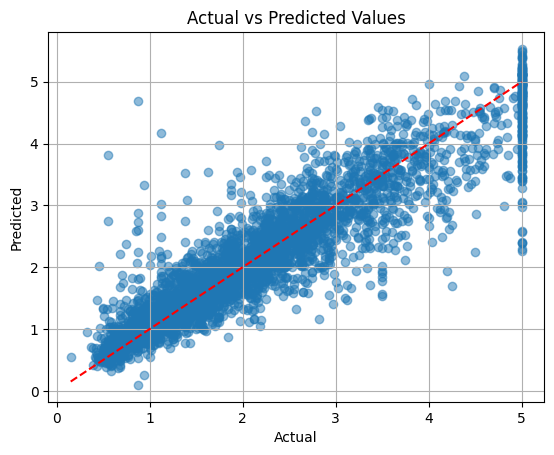

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(y_val, y_pred, alpha=0.5)
plt.plot([y_val.min(), y_val.max()], [y_val.min(), y_val.max()], 'r--')  # Perfect predictions
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Actual vs Predicted Values")
plt.grid(True)
plt.show()


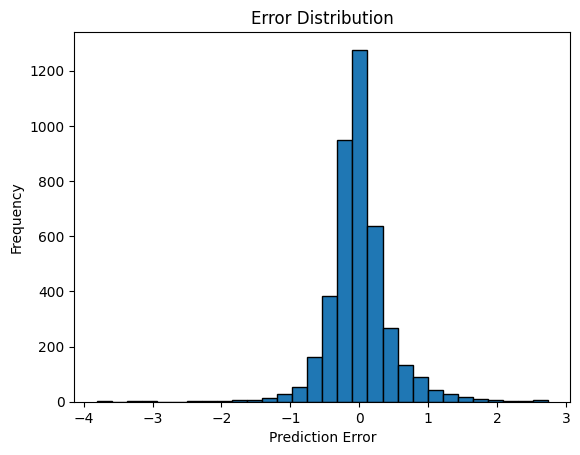

In [ ]:
errors = y_val - y_pred
plt.hist(errors, bins=30, edgecolor='k')
plt.xlabel("Prediction Error")
plt.ylabel("Frequency")
plt.title("Error Distribution")
plt.show()


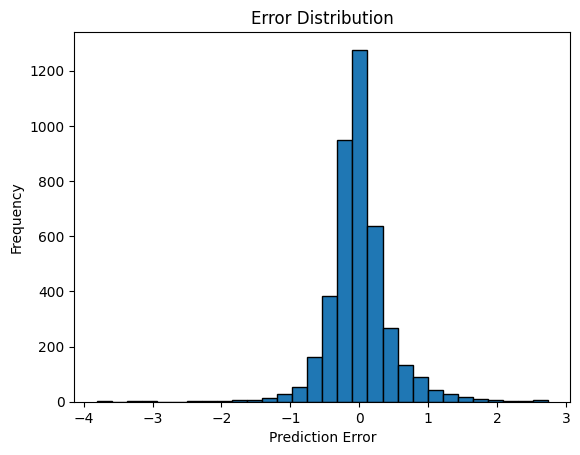

In [ ]:
errors = y_val - y_pred
plt.hist(errors, bins=30, edgecolor='k')
plt.xlabel("Prediction Error")
plt.ylabel("Frequency")
plt.title("Error Distribution")
plt.show()


SHAP FOR MODEL EXPLAINATION


In [ ]:
!pip install shap

In [ ]:
import shap

# Create an explainer
explainer = shap.Explainer(best_model, X_train)

# Calculate SHAP values
shap_values = explainer(X_val)


 97%|=================== | 3998/4128 [00:29<00:00]       

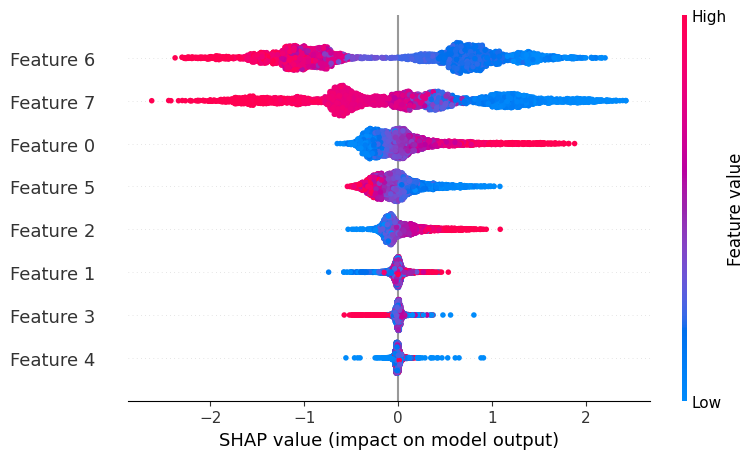

In [ ]:
shap.summary_plot(shap_values, X_val)


In [ ]:
pip install --upgrade shap shapash


In [ ]:
from shapash.explainer.smart_explainer import SmartExplainer

xpl = SmartExplainer(model=xgb_model, backend='shap')

In [ ]:
feature_names = X.columns.tolist()  # get feature names

# Convert X_test (numpy array) to DataFrame with feature names
X_test_df = pd.DataFrame(X_test, columns=feature_names)

In [ ]:
import pandas as pd

y_pred = pd.Series(xgb_model.predict(X_test_df), index=X_test_df.index)

xpl.compile(x=X_test_df, y_pred=y_pred)


INFO: Shap explainer type - <shap.explainers._tree.TreeExplainer object at 0x7b580b294550>


In [ ]:
xpl.to_pandas(max_contrib=3).head(10)

,y_pred,feature_1,value_1,contribution_1,feature_2,value_2,contribution_2,feature_3,value_3,contribution_3
2521380,-12.539275,LOG_PERCENTGROWTH,4.467975,-7.418972,LOG_EXPECTEDGROWTH,4.27362,-2.769355,NSC1,127716,0.0
732779,-6.811566,LOG_PERCENTGROWTH,4.500476,-7.426146,LOG_EXPECTEDGROWTH,4.399989,2.965526,NSC1,369100,0.0
2748865,3.401828,LOG_PERCENTGROWTH,-4.307343,81.44429,LOG_EXPECTEDGROWTH,-4.286506,-75.691505,NSC1,256942,0.0
530010,-0.091108,LOG_EXPECTEDGROWTH,4.587312,10.525376,LOG_PERCENTGROWTH,4.58965,-8.265542,NSC1,1390,0.0
2526937,-5.451744,LOG_PERCENTGROWTH,4.665889,-12.441952,LOG_EXPECTEDGROWTH,4.615121,9.341152,NSC1,750,0.0
2778694,-5.378971,LOG_EXPECTEDGROWTH,4.078842,-7.518891,LOG_PERCENTGROWTH,4.220419,4.490863,NSC1,256942,0.0
1035531,13.249341,LOG_EXPECTEDGROWTH,4.486499,10.491594,LOG_PERCENTGROWTH,4.237145,5.108689,NSC1,702294,0.0
2652794,5.524475,LOG_EXPECTEDGROWTH,4.521473,11.890036,LOG_PERCENTGROWTH,4.440437,-4.014619,NSC1,718781,0.0
2842770,-2.529089,LOG_PERCENTGROWTH,4.542156,-8.366908,LOG_EXPECTEDGROWTH,4.511222,8.188766,NSC1,256439,0.0
219251,-15.600052,LOG_PERCENTGROWTH,4.716801,-19.033838,LOG_EXPECTEDGROWTH,4.563723,5.784728,NSC1,226080,0.0


from matplotlib import pyplot as plt
_df_0['y_pred'].plot(kind='hist', bins=20, title='y_pred')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_1.groupby('feature_1').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_2.groupby('feature_2').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['y_pred'].plot(kind='line', figsize=(8, 4), title='y_pred')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['feature_2'].value_counts()
    for x_label, grp in _df_4.groupby('feature_1')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('feature_1')
_ = plt.ylabel('feature_2')

<string>:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_5['feature_1'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_5, x='y_pred', y='feature_1', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_6['feature_2'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_6, x='y_pred', y='feature_2', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
xpl

In [ ]:
app = xpl.run_app(title_story='Drug Growth Prediction')

Exception in thread Thread-9 (<lambda>):
Traceback (most recent call last):
  File "/usr/lib/python3.11/threading.py", line 1045, in _bootstrap_inner
    self.run()
  File "/usr/local/lib/python3.11/dist-packages/shapash/utils/threading.py", line 32, in __run
    self.__run_backup()
  File "/usr/lib/python3.11/threading.py", line 982, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/local/lib/python3.11/dist-packages/shapash/explainer/smart_explainer.py", line 1094, in <lambda>
    target=lambda: self.smartapp.app.run_server(debug=False, host=host, port=port)
                   ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/dash/_obsolete.py", line 22, in __getattr__
    raise err.exc(err.message)
dash.exceptions.ObsoleteAttributeException: app.run_server has been replaced by app.run


In [ ]:
!pip uninstall dash -y


Found existing installation: dash 3.0.4
Uninstalling dash-3.0.4:
  Successfully uninstalled dash-3.0.4


In [ ]:
pip install dash==2.14.2


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 40.8 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dash-bootstrap-components 2.0.3 requires dash>=3.0.4, but you have dash 2.14.2 which is incompatible.


In [ ]:
xpl.run_app()


NameError: name 'xpl' is not defined

In [ ]:
pip install -U shapash


  Using cached dash-3.0.4-py3-none-any.whl.metadata (10 kB)
Using cached dash-3.0.4-py3-none-any.whl (7.9 MB)
  Attempting uninstall: dash
    Found existing installation: dash 2.14.2
    Uninstalling dash-2.14.2:
      Successfully uninstalled dash-2.14.2


In [ ]:
predictor = xpl.to_smartpredictor()

In [ ]:
predictor.save('./predictor.pkl')

In [ ]:
from shapash.utils.load_smartpredictor import load_smartpredictor
predictor_load = load_smartpredictor('./predictor.pkl')

In [ ]:
# XGBoost Residuals
residuals_xgb = y_test - y_pred
sns.scatterplot(x=y_pred, y=residuals_xgb)
plt.axhline(0, color='red', linestyle='--')
plt.title("XGBoost Residuals")
plt.xlabel("Predicted")
plt.ylabel("Residuals")
plt.show()

NameError: name 'y_test' is not defined

# LIGHT BGM

In [ ]:
!pip uninstall -y lightgbm
!pip uninstall -y lightgbm
!pip uninstall -y lightgbm



Found existing installation: lightgbm 4.6.0
Uninstalling lightgbm-4.6.0:
  Successfully uninstalled lightgbm-4.6.0


In [ ]:
!pip show lightgbm


In [ ]:
!pip install lightgbm==4.6.0 --force-reinstall --no-cache-dir


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 92.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 87.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 146.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.7/37.7 MB 170.4 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.4
    Uninstalling numpy-1.24.4:
      Successfully uninstalled numpy-1.24.4
  Attempting uninstall: scipy
    Found existing installation: scipy 1.15.3
    Uninstalling scipy-1.15.3:
      Successfully uninstalled scipy-1.15.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 2.2.6 which is incompatible.
numba 0.60.0 requires numpy<

In [ ]:
!pip install numpy==1.24.4 --force-reinstall


  Using cached numpy-1.24.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (5.6 kB)
Using cached numpy-1.24.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.3 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.6
    Uninstalling numpy-2.2.6:
      Successfully uninstalled numpy-2.2.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jax 0.5.2 requires numpy>=1.25, but you have numpy 1.24.4 which is incompatible.
blosc2 3.3.4 requires numpy>=1.26, but you have numpy 1.24.4 which is incompatible.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.24.4 which is incompatible.
jaxlib 0.5.1 requires numpy>=1.25, but you have numpy 1.24.4 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 1.24.4 which is incompatible.
pymc 5.23.0 requires numpy>=1.25.0, but

In [ ]:
import lightgbm as lgb

# Initializing the model
lgb_model = lgb.LGBMRegressor(
    objective='regression',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3,
    random_state=42
)

In [ ]:
# Train the model
lgb_model.fit(X_train, y_train)

# Predict
y_pred_lgb = lgb_model.predict(X_test)

In [ ]:
# Evaluate
mae_lgb = mean_absolute_error(y_test, y_pred_lgb)
mse_lgb = mean_squared_error(y_test, y_pred_lgb)
rmse_lgb = np.sqrt(mse_lgb)
r2_lgb = r2_score(y_test, y_pred_lgb)

print(f"LightGBM MAE: {mae_lgb:.4f}")
print(f"LightGBM MSE: {mse_lgb:.4f}")
print(f"LightGBM RMSE: {rmse_lgb:.4f}")
print(f"LightGBM R²: {r2_lgb:.4f}")

LightGBM MAE: 1.6393
LightGBM MSE: 7.1601
LightGBM RMSE: 2.6758
LightGBM R²: 0.9530


In [ ]:
lgb_cv_scores = cross_val_score(lgb_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')


# Convert negative MSE to RMSE
lgb_rmse_scores = np.sqrt(-lgb_cv_scores)

# Print results
print("LightGBM Cross-Validation RMSE (10-Fold):")
print(f"Mean: {lgb_rmse_scores.mean():.4f}, Std: {lgb_rmse_scores.std():.4f}")
print("All RMSE scores:", lgb_rmse_scores)

LightGBM Cross-Validation RMSE (10-Fold):
Mean: 0.8999, Std: 0.0042
All RMSE scores: [0.89580055 0.90739145 0.90140975 0.89741803 0.89759243]


In [ ]:
# If y is a pandas Series or numpy array
print("Target value statistics:")
print(f"Min: {y.min():.4f}")
print(f"Max: {y.max():.4f}")
print(f"Mean: {y.mean():.4f}")
print(f"Median: {np.median(y):.4f}")
print(f"Standard Deviation: {y.std():.4f}")


Target value statistics:
Min: -227.0000
Max: 199.0000
Mean: -2.3507
Median: -2.0000
Standard Deviation: 12.3745


In [ ]:
import lightgbm as lgb
import optuna
from sklearn.model_selection import  cross_val_score


def objective(trial):
    param = {
        'objective': 'regression',
        'metric': 'rmse',
        'verbosity': -1,
        'boosting_type': 'gbdt',
        'random_state': 42,
        'n_estimators': 50,  # reduce for speed
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2, log=True),
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),
        'max_depth': trial.suggest_int('max_depth', 3, 8),
    }

    model = lgb.LGBMRegressor(**param)
    kf = KFold(n_splits=3, shuffle=True, random_state=42)
    rmse_scores = cross_val_score(model, X_train, y_train, scoring='neg_mean_squared_error', cv=kf, n_jobs=-1)
    rmse = np.mean(np.sqrt(-rmse_scores))
    return rmse

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=20)  # reduce for speed

print("Best trial:")
trial = study.best_trial
print(f"  RMSE: {trial.value}")
print("  Params:")
for key, value in trial.params.items():
    print(f"    {key}: {value}")


[I 2025-06-04 10:54:05,610] A new study created in memory with name: no-name-d8f1a528-8a93-4c91-9856-5bc6f6fff5a7
[I 2025-06-04 10:54:46,675] Trial 0 finished with value: 1.1647157108543487 and parameters: {'learning_rate': 0.13245878511467388, 'num_leaves': 61, 'max_depth': 6}. Best is trial 0 with value: 1.1647157108543487.
[I 2025-06-04 10:55:19,370] Trial 1 finished with value: 7.574791784841923 and parameters: {'learning_rate': 0.01753047851541394, 'num_leaves': 73, 'max_depth': 6}. Best is trial 0 with value: 1.1647157108543487.
[I 2025-06-04 10:55:49,672] Trial 2 finished with value: 1.0203574725138915 and parameters: {'learning_rate': 0.17242019341317943, 'num_leaves': 60, 'max_depth': 6}. Best is trial 2 with value: 1.0203574725138915.
[I 2025-06-04 10:56:24,301] Trial 3 finished with value: 1.1756746539152456 and parameters: {'learning_rate': 0.12794536736149106, 'num_leaves': 32, 'max_depth': 8}. Best is trial 2 with value: 1.0203574725138915.
[I 2025-06-04 10:56:57,295] Tri

Best trial:
  RMSE: 0.9530699180638313
  Params:
    learning_rate: 0.19980469970359657
    num_leaves: 53
    max_depth: 8


In [ ]:
# Retrain with best parameters
best_params = {
    'objective': 'regression',
    'metric': 'rmse',
    'verbosity': -1,
    'boosting_type': 'gbdt',
    'random_state': 42,
    'n_estimators': 50,  # same as in the search
    'learning_rate': 0.19980469970359657,
    'num_leaves': 53,
    'max_depth': 8
}

final_model = lgb.LGBMRegressor(**best_params)
final_model.fit(X_train, y_train)


LGBMRegressor(learning_rate=0.19980469970359657, max_depth=8, metric='rmse',
              n_estimators=50, num_leaves=53, objective='regression',
              random_state=42, verbosity=-1)

In [ ]:
# Predict on test data
y_pred = final_model.predict(X_test)

# Evaluate performance
from sklearn.metrics import mean_squared_error
rmse = mean_squared_error(y_test, y_pred)
print(f"Test RMSE: {rmse:.4f}")


Test RMSE: 0.9113


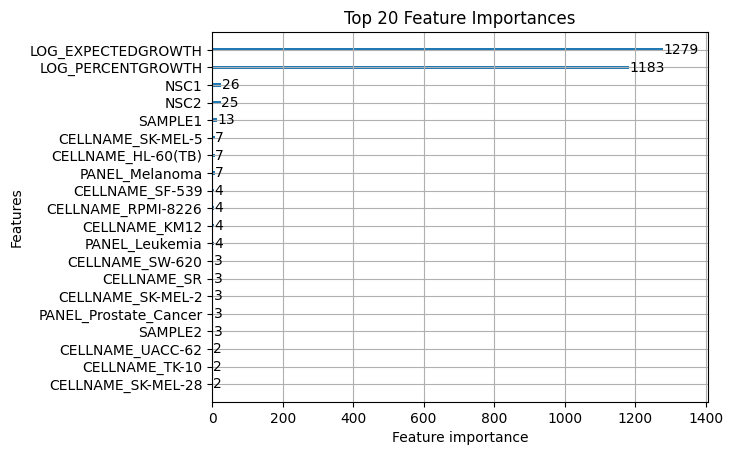

In [ ]:
import matplotlib.pyplot as plt
lgb.plot_importance(final_model, max_num_features=20)
plt.title("Top 20 Feature Importances")
plt.show()


In [ ]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.5/19.5 MB 37.4 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.6
    Uninstalling numpy-2.2.6:
      Successfully uninstalled numpy-2.2.6


In [ ]:
import shap

In [ ]:
explainer = shap.TreeExplainer(lgb_model)
shap_values = explainer.shap_values(X_val)

# Then plot summary plot
shap.summary_plot(shap_values, X_val)


NameError: name 'lgb_model' is not defined

RANDOM FORREST-TRY

In [ ]:
# Predict
y_pred = model.predict(X_val)
rmse = mean_squared_error(y_val, y_pred, squared=False)
print(f'RMSE on validation set: {rmse:.4f}')

In [ ]:
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)

In [ ]:
# Evaluation Metrics
mae_rf = mean_absolute_error(y_test, y_pred_rf)
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)
r2_rf = r2_score(y_test, y_pred_rf)

In [ ]:
print("Random Forest Evaluation:")
print(f"MAE: {mae_rf:.4f}")
print(f"MSE: {mse_rf:.4f}")
print(f"RMSE: {rmse_rf:.4f}")
print(f"R²: {r2_rf:.4f}")

Random Forest Evaluation:
MAE: 0.0779
MSE: 0.0317
RMSE: 0.1779
R²: 0.9998


In [ ]:
# Random Forest CV
rf_cv_scores = cross_val_score(rf_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
rf_rmse_scores = np.sqrt(-rf_cv_scores)
print("\n📈 Random Forest Cross-Validation RMSE (5-Fold):")
print(f"Mean: {rf_rmse_scores.mean():.4f}, Std: {rf_rmse_scores.std():.4f}")

In [ ]:
# Random Forest Grid Search
rf_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20]
}

rf_grid = GridSearchCV(rf_model, rf_param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
rf_grid.fit(X_train, y_train)

print("Best Random Forest Params:", rf_grid.best_params_)
print("Best Random Forest RMSE:", np.sqrt(-rf_grid.best_score_))

In [ ]:
# Random Forest Residuals
residuals_rf = y_test - y_pred_rf
sns.scatterplot(x=y_pred_rf, y=residuals_rf)
plt.axhline(0, color='red', linestyle='--')
plt.title("Random Forest Residuals")
plt.xlabel("Predicted")
plt.ylabel("Residuals")
plt.show()